# Figures

In here, all the main figures are plotted

In [ ]:
import itertools
import os
from datetime import date, timedelta
import glob

import numpy as np
import pandas as pd
from ridgeplot import ridgeplot

import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.renderers.default = 'notebook'
from graphmodex import plotlymodex
from plotly.subplots import make_subplots
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from matplotlib import font_manager
import matplotlib as mpl

from bumplot import bumplot

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import friedmanchisquare
import scikit_posthocs as sp 
import scipy.stats as stats
from statsmodels.stats.multitest import multipletests
from scipy.stats import pearsonr

from statsforecast import StatsForecast

from scipy.interpolate import griddata

# Data & Config

In [4]:
# ===============================
# CONFIG
# ===============================
steps_per_day = 8
two_year_steps = 2 * 365 * steps_per_day
target_windows = 30

FREQ = '3h'
SEASON_LENGTH = 8 

pollutants_dict = {
        'go3': {
            'scaler': 1e8
        },
        'no2': {
            'scaler': 1e10
        },
        'pm10': {
            'scaler': 1e9
        },
        'pm2p5': {
            'scaler': 1e9
        },
    }
experiments_dict = {
    '1 days': {
        'horizon': 8*1,
        'step_size': max(8*1, two_year_steps // target_windows),
        'windows': target_windows,
    },
    '7 days': {
        'horizon': 8*7,
        'step_size': max(8*7, two_year_steps // target_windows),
        'windows': target_windows,
    },
    '14 days': {
        'horizon': 8*14,
        'step_size': max(8*14, two_year_steps // target_windows),
        'windows': target_windows,
    },
    '30 days': {
        'horizon': 8*30,
        'step_size': 8*30,
        'windows': two_year_steps // (8*30),  # 24
    },
}

database_full = pd.read_csv(r'.\Results\RQ1\full\go3_1days.csv')
database_full = database_full.query("NHITS.notna()")

metrics = pd.read_csv(r'.\Results\RQ1\metrics.csv')

# Forecasting

In [395]:
def plot_pollutant_forecasting(
        poll='go3',
        h=1,
        uid=0,
        models={
            'NHITS': "#287eb8",
            'NBEATS-G': "#72a549",
            'NBEATS-I': "#d4bc34",
            'LightGBM': "#6c34d4",
            'Naive': "#d43f34",
            'SeasonalNaive': "#d4347f",
        },
        horizon=None,  # Adicionando o parâmetro horizon
        y_range=None,
        x_range=None,
        y_anchor=0.2,
    ):

    # Mapeamento para o título formatado
    poll_names = {
        'go3': r'$\text{O}_{3} \text{  } [\mathrm{kg\ kg^{-1}}]$',
        'no2': r'$\text{NO}_{2} \text{  } [\mathrm{kg\ kg^{-1}}]$',
        'pm10': r'$\text{PM}_{10} \text{  } [\mathrm{kg\ kg^{-1}}]$',
        'pm2p5': r'$\text{PM}_{2.5} \text{  } [\mathrm{kg\ kg^{-1}}]$'
    }
    poll_title = poll_names.get(poll, poll.upper())

    series = pd.read_parquet(rf'.\Results\RQ1\full\{poll}.parquet')

    df = pd.read_csv(rf'.\Results\RQ1\full\{poll}_{str(h)}days.csv')
    # df = df.query("NHITS.notna()")
    df = df.rename(columns={'valid_time': 'ds'})
    df = df.astype({
        'ds': 'datetime64[ns]',
        'cutoff': 'datetime64[ns]',
    })

    cutoffs = df['cutoff'].unique() 

    # ==================================================
    # REAL SERIE
    # ==================================================
    fig = go.Figure()

    pollutant_filt = series.copy().query(
        "ds >= '2022-06-01' and unique_id == @uid"
    )

    fig.add_trace(
        go.Scatter(
            x=pollutant_filt['ds'],
            y=pollutant_filt['y'],
            mode='lines',
            line=dict(color='black', width=3),
            name='Real'
        )
    )

    # ==================================================
    # MODELS — ONE WINDOW PER CUTOFF
    # ==================================================
    for model, color in models.items():
        show_legend_ = True
        for cutoff in cutoffs:

            df_fold = df.query(
                "unique_id == @uid and cutoff == @cutoff"
            )

            if df_fold.empty:
                continue

            # Linha da previsão (segmento independente)
            fig.add_trace(
                go.Scatter(
                    x=df_fold['ds'],
                    y=df_fold[model],
                    mode='lines',
                    line=dict(color=color, width=3),
                    marker=dict(color=color, size=5),
                    opacity=0.9,
                    name=model,
                    showlegend=show_legend_
                )
            )

            show_legend_ = False

    # ==================================================
    # CUTOFFS VERTICAL LINES
    # ==================================================
    for cutoff in cutoffs:
        fig.add_vline(
            x=cutoff + pd.Timedelta(hours=3),
            line_width=1,
            line_dash="dot",
            line_color="black",
            opacity=0.5
        )
        if horizon is not None:  # Usando o horizonte fornecido como parâmetro
            fig.add_vline(
                x=cutoff + pd.Timedelta(hours=3 * horizon),
                line_width=1,
                line_dash="dot",
                line_color="black",
                opacity=0.5
            )

    # ==================================================
    # FINAL LAYOUT
    # ==================================================
    plotlymodex.main_layout(
        fig, width=1200, height=600,
        x=r"$\mathrm{time_{\ freq: 3 h}}$",
        y=f"{poll_title}",
        title=f'Pollutant Forecasting | Cross-Validation Windows',
        x_range=x_range, y_range=y_range
    )

    fig.update_layout(
        legend_title_text='Series',
        hovermode='x unified',

        # Fonte global
        font=dict(
            family="Times New Roman",
            size=16,
            color="black"
        ),

        # Eixo X
        xaxis=dict(
            showgrid=False, zeroline=False,
            title_font=dict(family="Times New Roman"),
            tickfont=dict(family="Times New Roman")
        ),

        # Eixo Y
        yaxis=dict(
            zeroline=False,
            title_font=dict(family="Times New Roman"),
            tickfont=dict(family="Times New Roman")
        ),
    )

    fig.update_layout(
        # Margens bem mais compactas
        margin=dict(
            l=60,
            r=10,
            t=60, 
            b=30
        ),

        # Título mais compacto
        title=dict(
            y=0.97,
            yanchor='top'
        )
    )

    fig.update_layout(
        legend=dict(
            x=0.01,      # esquerda
            y=y_anchor,  # topo
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255,255,255,0.9)',  # opcional
            bordercolor='black',              # opcional
            borderwidth=2                     # opcional
        )
    )

    return fig

In [478]:
# df_final.query("pollutant == 'no2' and horizon == '7days' and unique_id == 92").sort_values('ranking', ascending=True)
# df_final.query("model == 'NBEATS-I' and ranking == 1").sort_values('ranking', ascending=True)
# pd.read_csv(r'..\Data\CAMS\processed\unique_id_info.csv').query("unique_id == 92")

In [476]:
# Exemplo de chamada da função para um dado modelo e cutoff
models = {
    # 'NHITS': "#c4ad7",
    # 'NBEATS-G': "#c4ad7",
    # 'NBEATS-I': "#c4ad7",
    'NHITS': "#e6723d",
    'NBEATS-G': "#803de6",
    'NBEATS-I': "#3de6a2",
    # 'LightGBM': "#6aa040",
    # 'XGBoost': "#6aa040",
    # 'RandomForest': "#6aa040",
    # 'GRU': "#e01f66",
    # 'LSTM': "#e01f66",
    # 'Informer': "#e01f66",
    # 'Arima': "#5cc8e6",
    # 'Theta': "#5cc8e6",
    # 'ETS': "#5cc8e6",
    # 'Naive': "#c9c9c9",
    # 'SeasonalNaive-8': "#c9c9c9",
    # 'SeasonalNaive-56': "#c9c9c9",
}

init_date = date(2024, 10, 8)
last_date = init_date + timedelta(37)
# Chamada da função com o ID único, cutoffs e modelos
fig = plot_pollutant_forecasting(
    poll='no2',
    h=7,
    uid=92,
    models=models,
    x_range=[str(init_date), str(last_date)],
    y_range=[-0e-9, 7e-9],
    y_anchor=0.99,
)
fig.show()
filename = f"no2_7days_uid92_dec.png"
fig.write_image(filename, scale=3)

init_date = date(2023, 1, 16)
last_date = init_date + timedelta(37)
fig = plot_pollutant_forecasting(
    poll='no2',
    h=7,
    uid=92,
    models=models,
    x_range=[str(init_date), str(last_date)],
    y_range=[-0e-9, 7e-9],
    y_anchor=0.99,
)
fig.show()
filename = f"no2_7days_uid92_aug.png"
fig.write_image(filename, scale=3)

In [ ]:

str(date(2024, 5, 17) + timedelta(20))

'2024-06-06'

## ACF & PACF

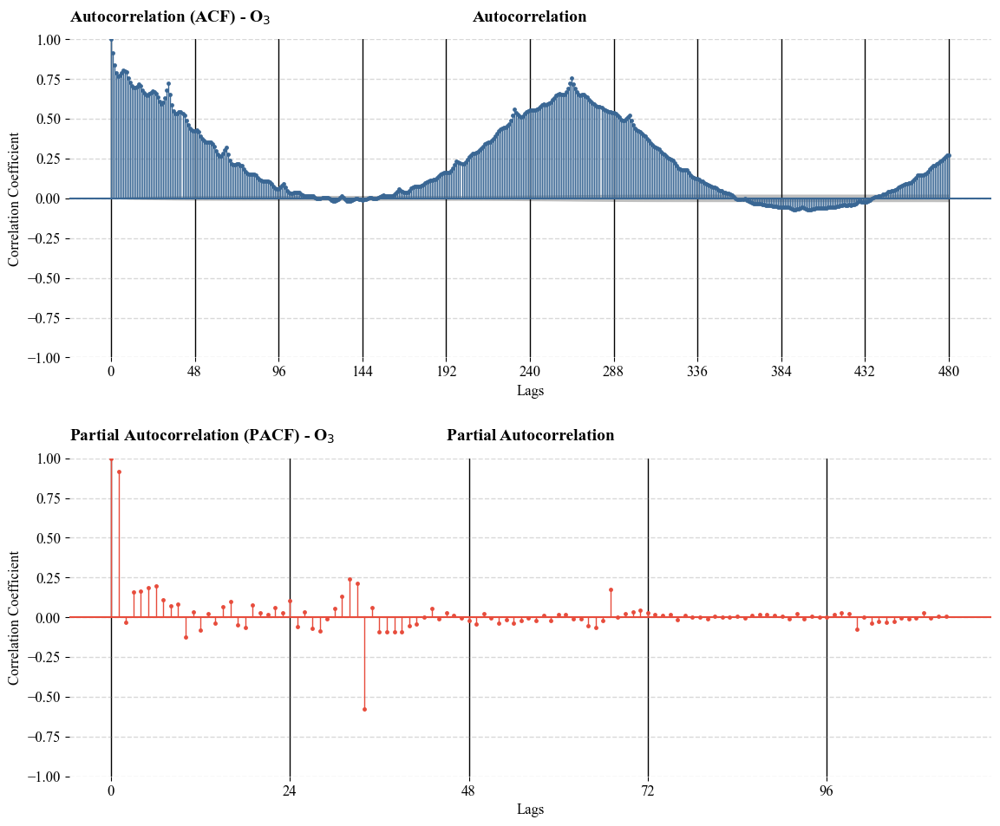

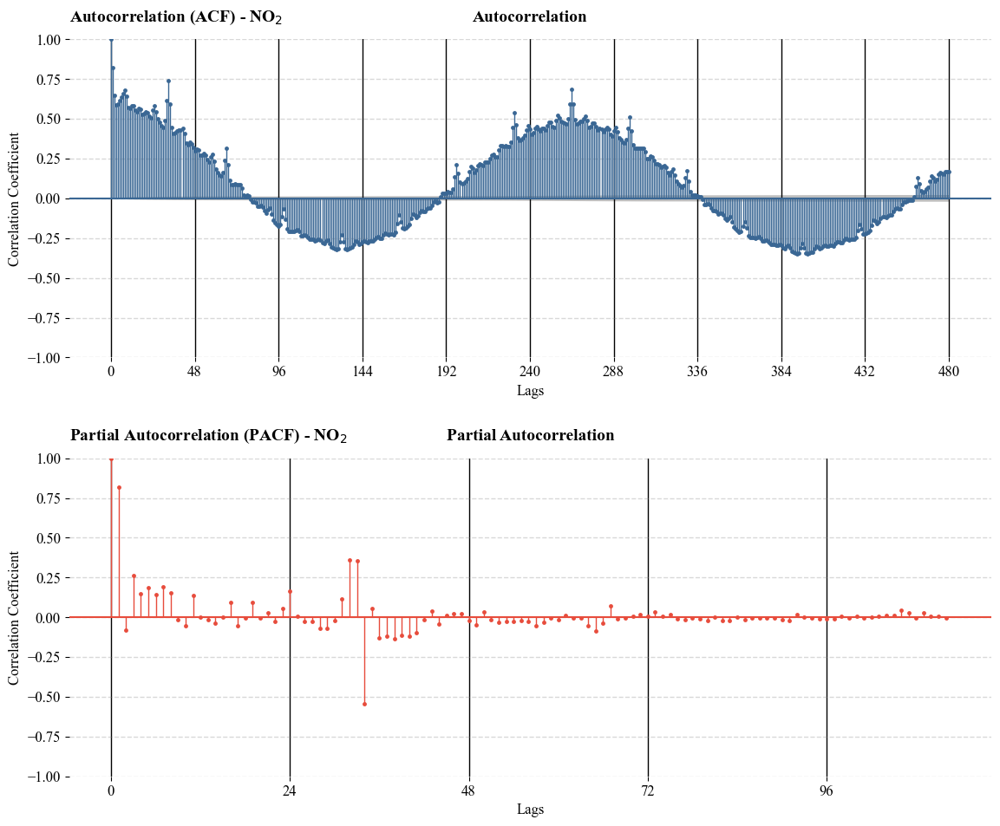

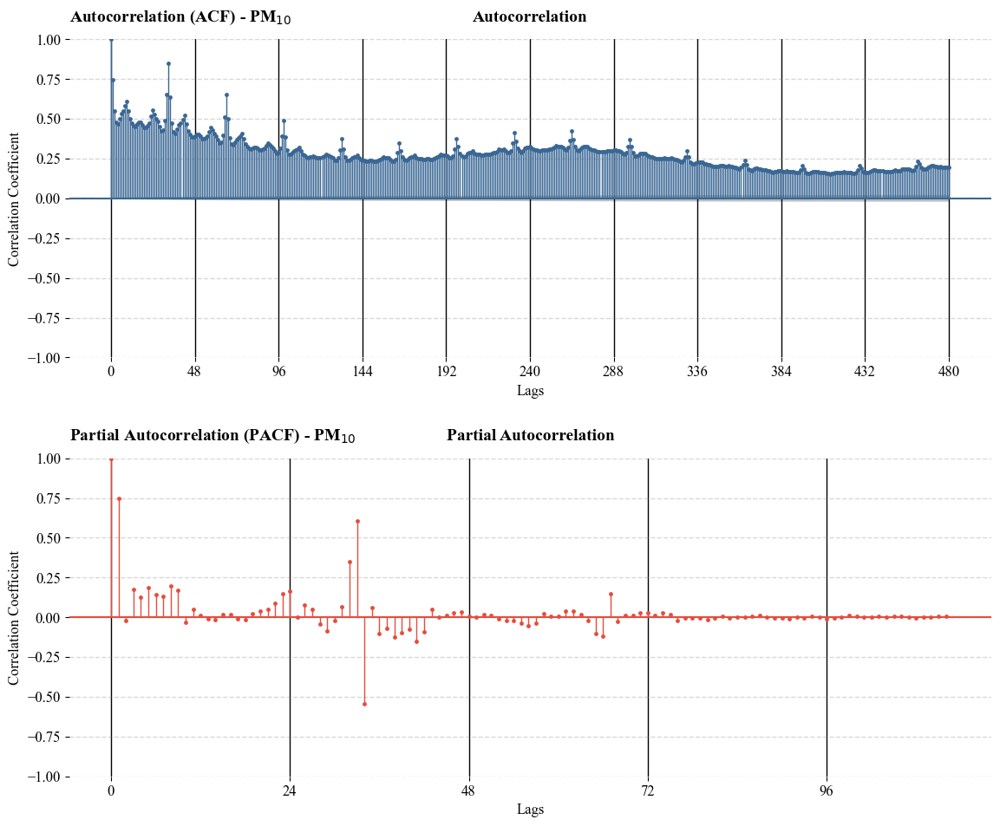

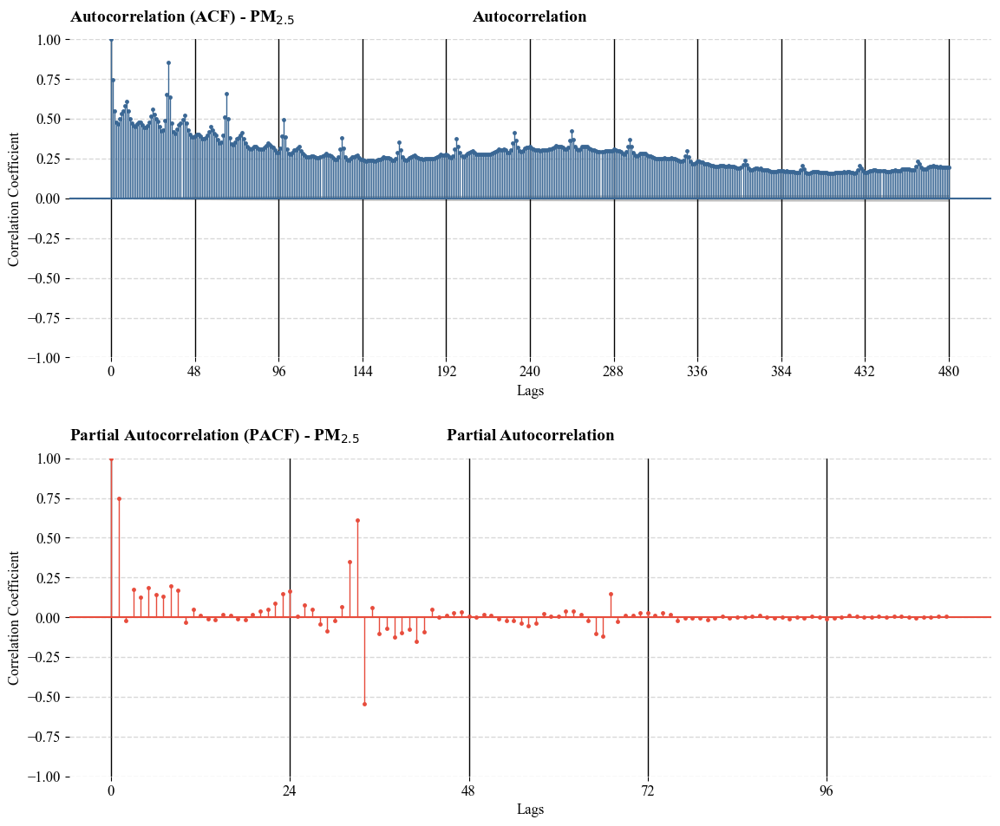

In [31]:
def plot_acf_pacf_publication(df, pollutant_name, lags_acf=8*60, lags_pacf=8*14, save_path=None):
    """
    Gera gráficos de ACF e PACF em padrão de publicação A1.
    """
    # 1. Configuração de Estilo (Consistente e de alto contraste)
    plt.rcParams.update({
        "font.family": "Times New Roman",
        "font.size": 12,
        "axes.edgecolor": "#000000",
        "axes.labelcolor": "#000000",
        "xtick.color": "#000000",
        "ytick.color": "#000000",
        "text.color": "#000000",
        "axes.titlesize": 14,
        "axes.titleweight": "bold"
    })

    # Dicionário de nomes formatados para o título (LaTeX)
    display_names = {
        "no2": r"NO$_2$",
        "pm10": r"PM$_{10}$",
        "pm2p5": r"PM$_{2.5}$",
        "go3": r"O$_{3}$",
    }
    
    label_pol = display_names.get(pollutant_name.lower(), pollutant_name.upper())
    
    # Preparação dos dados (Assumindo que o filtro de data já foi feito ou deve ser feito aqui)
    # Se o seu df já vier filtrado, pode remover o .query
    data_series = df.query("ds.between('2015-01-01', '2022-12-31')")["y"]

    # 2. Criação da Figura
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

    v_params_acf = {"colors": "#3a6794", "linewidth": 1.0, "alpha": 1.0}
    v_params_pacf = {"colors": "#e74c3c", "linewidth": 1.0, "alpha": 1.0}

    # --- Plot ACF ---
    plot_acf(data_series, lags=lags_acf, ax=ax1, 
             color="#3a6794", 
             vlines_kwargs=v_params_acf,
             alpha=0.05)
    ax1.set_title(f"Autocorrelation (ACF) - {label_pol}", loc='left', pad=15)

    # --- Plot PACF ---
    plot_pacf(data_series, lags=lags_pacf, ax=ax2, 
              color="#e74c3c", 
              vlines_kwargs=v_params_pacf,
              alpha=0.05)
    ax2.set_title(f"Partial Autocorrelation (PACF) - {label_pol}", loc='left', pad=15)

    # 3. Refinamento de Layout
    for ax in [ax1, ax2]:
        ax.spines[["top", "right"]].set_visible(False)
        ax.spines[["left", "bottom"]].set_edgecolor('black')
        ax.spines[["left", "bottom"]].set_linewidth(1.0)
        
        ax.grid(True, axis='y', linestyle='--', alpha=0.3, color='gray')
        
        ax.set_xlabel("Lags", color='black')
        ax.set_ylabel("Correlation Coefficient", color='black')
        
        for line in ax.get_lines():
            line.set_markersize(3.5)
            line.set_markeredgewidth(0)

    # Ajuste dos Ticks do eixo X (Dinâmico baseado no número de lags)
    ax1.xaxis.set_major_locator(ticker.MultipleLocator(base=48))
    ax2.xaxis.set_major_locator(ticker.MultipleLocator(base=12 if lags_pacf <= 100 else 24))

    plt.tight_layout(pad=2.0)

    if save_path:
        plt.savefig(save_path, dpi=600, bbox_inches='tight', facecolor='white')
    
    return fig, (ax1, ax2)

for pol_ in ['go3', 'no2', 'pm10', 'pm2p5']:
    series = pd.read_parquet(rf'.\Results\RQ1\full\{pol_}.parquet')
    fig, axs = plot_acf_pacf_publication(series, f"{pol_}", save_path=f"acf_pacf_{pol_}.png")
    plt.show()

# **RQ1**

## sMAPE Ridge

In [386]:
# Version with Gradient

def plot_ridge_metrics(h : str = '30', metric: str = 'sMAPE', agg_func: str = 'median'):

    # ===============================
    # DATA PREPARATION
    # ===============================

    df_plot = metrics.dropna(subset=[metric])

    median_smape = (
        df_plot
        .query(f"horizon == '{h}days'")
        .groupby("model")[metric]
        .agg(agg_func)
        .sort_values()
    )

    ordered_models = median_smape.index.tolist()

    samples = [
        df_plot.loc[df_plot["model"] == m, metric].values
        for m in ordered_models
    ]

    labels = ordered_models


    # ===============================
    # RIDGEPLOT
    # ===============================

    fig = ridgeplot(samples=samples, labels=labels)

    for tr in fig.data:
        tr.showlegend = False

    plotlymodex.main_layout(
        fig,
        title=f"Distribution of {h}-Day-Ahead {metric} by Model (Ordered by {agg_func.capitalize()} Performance)",
        width=1000,
        height=700,
        x=f"{metric}↓",
        y=None
    )

    fig.update_layout(font=dict(family="Times New Roman", size=16))


    # ===============================
    # CUSTOM Y-AXIS LABELS
    # ===============================

    yvals = list(fig.layout.yaxis.tickvals)

    fig.update_yaxes(showticklabels=False)

    NAME_SHIFT = 0
    MU_SHIFT = -15

    for y, m in zip(yvals, ordered_models):

        fig.add_annotation(
            xref="paper",
            x=0, yref="y",
            y=y, text=f"{m}  ",
            showarrow=False,
            xanchor="right",
            align="right",
            font=dict(family="Times New Roman", size=16),
            yshift=NAME_SHIFT
        )

        fig.add_annotation(
            xref="paper",
            x=0, yref="y",
            y=y, text=f"{agg_func.capitalize()} = {median_smape[m]:.3f}  ",
            showarrow=False,
            xanchor="right",
            align="right",
            font=dict(family="Times New Roman", size=12),
            yshift=MU_SHIFT
        )

    fig.update_layout(
        margin=dict(l=140, r=40, t=50, b=60),
        title=dict(y=0.97, yanchor="top")
    )


    # ===============================
    # MODEL FAMILIES
    # ===============================

    neural_models = ["NBEATS-I", "NBEATS-G", "NHITS"]
    ml_models = ["LightGBM", "RandomForest", "XGBoost"]
    stat_models = ["Arima", "ETS", "Theta"]
    benchmark_models = ["Naive", "SeasonalNaive-8", "SeasonalNaive-56"]
    dl_models = ["GRU", "LSTM", "Informer"]


    # ===============================
    # COLOR GRADIENT MAP
    # ===============================

    family_gradients = {
        "neural": ["#D62121", "#ECD449", "#ECD449"],
        "ml": ["#00B17A", "#3676AA", "#6D2DA8"],
        "stat": ["#BD5CE4", "#38C4DD", "#38C4DD"],
        "benchmark": ["#707070", "#E7E7E7", "#E7E7E7"],
        "dl": ["#DD7DCD", "#CF5C9F", "#DA4444"],
    }
  
 
    # ===============================
    # FAMILY IDENTIFICATION
    # ===============================

    def get_family(model):
        if model in neural_models:
            return "neural"
        elif model in ml_models:
            return "ml"
        elif model in stat_models:
            return "stat"
        elif model in benchmark_models:
            return "benchmark"
        elif model in dl_models:
            return "dl"
        else:
            return None


    def build_colorscale(anchor_colors):
        colors = plotlymodex.list_colors(
            n=20,
            colors=anchor_colors,
            weights=[0, 0.5, 1]
        )
        return [[i/(len(colors)-1), c] for i, c in enumerate(colors)]


    # ===============================
    # APPLY GRADIENTS
    # ===============================

    for trace in fig.data:

        if trace.fill == "tonexty":

            model = trace.name
            family = get_family(model)

            if family is not None:

                anchors = family_gradients[family]

                trace.fillgradient = dict(
                    type="horizontal",
                    colorscale=build_colorscale(anchors)
                )

    fig.update_xaxes(
        showgrid=True,
        gridwidth=0.4,
        gridcolor="rgba(0,0,0,0.07)"
    )
    fig.update_xaxes(range=[0, 1.5])
    fig.update_yaxes(showgrid=False)

    for trace in fig.data:
        trace.line.width = 1

    fig.show()

In [387]:
# Defined Colors Version

def plot_ridge_metrics(h: str = '30', metric: str = 'sMAPE', agg_func: str = 'median'):

    # ===============================
    # DATA PREPARATION
    # ===============================

    df_plot = metrics.dropna(subset=[metric])

    median_smape = (
        df_plot
        .query(f"horizon == '{h}days'")
        .groupby("model")[metric]
        .agg(agg_func)
        .sort_values()
    )

    ordered_models = median_smape.index.tolist()

    samples = [
        df_plot.loc[df_plot["model"] == m, metric].values
        for m in ordered_models
    ]

    labels = ordered_models


    # ===============================
    # RIDGEPLOT
    # ===============================

    fig = ridgeplot(samples=samples, labels=labels)

    for tr in fig.data:
        tr.showlegend = False

    plotlymodex.main_layout(
        fig,
        title=f"Distribution of {h}-Day-Ahead {metric} by Model (Ordered by {agg_func.capitalize()} Performance)",
        width=1000,
        height=700,
        x=f"{metric}↓",
        y=None
    )

    fig.update_layout(font=dict(family="Times New Roman", size=16))


    # ===============================
    # CUSTOM Y-AXIS LABELS
    # ===============================

    yvals = list(fig.layout.yaxis.tickvals)

    fig.update_yaxes(showticklabels=False)

    NAME_SHIFT = 0
    MU_SHIFT = -15

    for y, m in zip(yvals, ordered_models):

        fig.add_annotation(
            xref="paper",
            x=0, yref="y",
            y=y, text=f"{m}  ",
            showarrow=False,
            xanchor="right",
            align="right",
            font=dict(family="Times New Roman", size=16),
            yshift=NAME_SHIFT
        )

        fig.add_annotation(
            xref="paper",
            x=0, yref="y",
            y=y, text=f"{agg_func.capitalize()} = {median_smape[m]:.3f}  ",
            showarrow=False,
            xanchor="right",
            align="right",
            font=dict(family="Times New Roman", size=12),
            yshift=MU_SHIFT
        )

    fig.update_layout(
        margin=dict(l=140, r=40, t=50, b=60),
        title=dict(y=0.97, yanchor="top")
    )


    # ===============================
    # MODEL FAMILIES
    # ===============================

    neural_models = ["NBEATS-I", "NBEATS-G", "NHITS"]
    ml_models = ["LightGBM", "RandomForest", "XGBoost"]
    stat_models = ["Arima", "ETS", "Theta"]
    benchmark_models = ["Naive", "SeasonalNaive-8", "SeasonalNaive-56"]
    dl_models = ["GRU", "LSTM", "Informer"]


    # ===============================
    # COLOR MAP (Correção no formato da cor com transparência)
    # ===============================

    color_map = {
        'Neural': "rgba(233, 163, 58, 0.67)",  
        'ML': 'rgba(106, 160, 64, 0.67)',      
        'Stats': 'rgba(92, 200, 230, 0.67)',   
        'Benchmark': 'rgba(201, 201, 201, 0.67)',
        'DL': 'rgba(224, 31, 102, 0.5)',
        'Other': 'rgba(0, 0, 0, 1)'             
    }

    # ===============================
    # FAMILY IDENTIFICATION
    # ===============================

    def get_family(model):
        if model in neural_models:
            return "Neural"
        elif model in ml_models:
            return "ML"
        elif model in stat_models:
            return "Stats"
        elif model in benchmark_models:
            return "Benchmark"
        elif model in dl_models:
            return "DL"
        else:
            return "Other"


    # ===============================
    # APPLY FIXED COLORS & FILLS
    # ===============================

    for trace in fig.data:
        # 1. Identificamos se o traço é uma curva (possui nome)
        if trace.name is not None:
            model = trace.name
            family = get_family(model)
            family_color = color_map.get(family, color_map["Other"])

            # 2. Forçar contorno preto e largura
            trace.line.color = 'black'
            trace.line.width = 1.5
            
            # 3. Remover o gradiente para que a fillcolor funcione
            if 'fillgradient' in trace:
                trace.fillgradient = None
            
            # 4. Definir preenchimento sólido com a cor da família
            trace.fill = 'toself'
            trace.fillcolor = family_color
            
        else:
            # Estes são os traços da "base" (linhas horizontais pretas)
            # Se você quiser que eles sumam ou fiquem mais sutis:
            trace.line.width = 1
            trace.line.color = 'rgba(0,0,0,0.3)' # Deixa a base semi-transparente

    fig.update_xaxes(
        showgrid=True,
        gridwidth=0.4,
        gridcolor="rgba(0,0,0,0.07)"
    )
    fig.update_xaxes(range=[0, 1.5])
    fig.update_yaxes(showgrid=False)

    for trace in fig.data:
        trace.line.width = 0.8  

    return fig


In [ ]:
# Lista de horizontes que você deseja processar
horizontes = [1, 7, 14, 30]

for h_val in horizontes:
    fig = plot_ridge_metrics(h=h_val, metric='sMAPE', agg_func='median')
    
    # filename = f"ridgeplot_h{h_val}_smape.png"
    # fig.write_image(filename, scale=3)
    # print(f"✅ Salvo: {filename}")
    
    fig.show()

In [ ]:
def plot_horizon_degradation(df_metrics, metric='sMAPE', agg_func='median'):
    # Prepara os dados agrupando por modelo e horizonte
    df_grouped = (
        df_metrics
        .groupby(['model', 'horizon'])[metric]
        .agg(agg_func)
        .reset_index()
    )
    
    # Converte horizonte para numérico se necessário (ex: '30days' -> 30)
    if df_grouped['horizon'].dtype == 'object':
        df_grouped['horizon_num'] = df_grouped['horizon'].str.extract(r'(\d+)').astype(int)

    df_grouped = df_grouped.query("horizon.isin(['1days', '30days'])")

    fig = px.line(
        df_grouped.sort_values('horizon_num'), 
        x='horizon_num', 
        y=metric, 
        color='model',
        markers=True,
        title=f"Degradação da Performance: {metric} vs. Horizonte",
        labels={'horizon_num': 'Horizonte (Dias)', metric: f'{agg_func.capitalize()} {metric}'}
    )
    
    fig.update_layout(template="simple_white", hovermode="x unified")
    return fig

def get_degradation_table(df_metrics, metric='sMAPE'):
    # Agrupa e limpa
    df_res = df_metrics.groupby(['model', 'horizon'])[metric].median().unstack()
    
    # Supõe que as colunas sejam '1days', '7days', '30days', etc.
    # Vamos calcular a diferença percentual entre o menor e o maior horizonte
    horizontes = sorted(df_res.columns, key=lambda x: int(''.join(filter(str.isdigit, x))))
    h_min, h_max = horizontes[0], horizontes[-1]
    
    df_res['Delta_Absoluto'] = df_res[h_max] - df_res[h_min]
    df_res['Degradação_%'] = (df_res[h_max] / df_res[h_min] - 1) * 100
    
    return df_res[['Delta_Absoluto', 'Degradação_%']].sort_values('Degradação_%', ascending=False)

# plot_horizon_degradation(metrics)
get_degradation_table(metrics)

horizon,Delta_Absoluto,Degradação_%
model,,
LightGBM,0.170109,58.155156
ETS,0.223363,58.004604
Informer,0.215749,54.636919
Arima,0.182319,49.537110
Theta,0.148539,40.919840
NBEATS-G,0.121757,38.578783
NBEATS-I,0.120969,38.059498
NHITS,0.120277,37.907477
SeasonalNaive-8,0.151312,37.286464


## Statistics

### Metrics

In [389]:
table_metrics = metrics.copy(deep=True)

table_metrics = (
    metrics
    .groupby(['horizon', 'model'])
    .agg(
        MAE_mean=('MAE', 'mean'),
        MAE_std=('MAE', 'std'),
        RMSE_mean=('RMSE', 'mean'),
        RMSE_std=('RMSE', 'std'),
        sMAPE_mean=('sMAPE', 'mean'),
        sMAPE_std=('sMAPE', 'std'),
    )
    .reset_index()
)

table_metrics["MAE"] = table_metrics.apply(
    lambda x: f"{x['MAE_mean']:.3e} ± {x['MAE_std']:.3e}", axis=1
)

table_metrics["RMSE"] = table_metrics.apply(
    lambda x: f"{x['RMSE_mean']:.3e} ± {x['RMSE_std']:.3e}", axis=1
)

table_metrics["sMAPE"] = table_metrics.apply(
    lambda x: f"{x['sMAPE_mean']:.3f} ± {x['sMAPE_std']:.3f}", axis=1
)

# Agora sim podemos selecionar
final_table = table_metrics[
    ["model", "horizon", "MAE", "RMSE", "sMAPE"]
]

table_metrics = table_metrics.sort_values(
    by=["horizon", "MAE_mean"],
    ascending=[True, True]  # menor MAE primeiro
)

table_metrics = table_metrics.query("horizon == '1days'")[["model", "MAE", "RMSE", "sMAPE"]]
# table_metrics.to_excel(r'metrically.xlsx')
table_metrics

,model,MAE,RMSE,sMAPE
23,NHITS,4.377e-09 ± 4.556e-09,5.242e-09 ± 5.351e-09,0.368 ± 0.233
21,NBEATS-G,4.427e-09 ± 4.835e-09,5.290e-09 ± 5.601e-09,0.367 ± 0.233
22,NBEATS-I,4.467e-09 ± 4.851e-09,5.332e-09 ± 5.600e-09,0.372 ± 0.240
20,LightGBM,4.596e-09 ± 6.358e-09,5.466e-09 ± 7.249e-09,0.355 ± 0.227
18,Informer,4.860e-09 ± 5.114e-09,5.727e-09 ± 5.811e-09,0.426 ± 0.236
19,LSTM,5.075e-09 ± 5.412e-09,5.932e-09 ± 6.035e-09,0.417 ± 0.251
17,GRU,5.165e-09 ± 5.517e-09,6.039e-09 ± 6.181e-09,0.424 ± 0.248
15,Arima,5.519e-09 ± 5.772e-09,6.512e-09 ± 6.540e-09,0.453 ± 0.326
28,Theta,5.867e-09 ± 6.937e-09,6.819e-09 ± 7.588e-09,0.443 ± 0.283
27,SeasonalNaive-8,6.041e-09 ± 7.471e-09,7.175e-09 ± 8.762e-09,0.483 ± 0.304


### Nemenyi

In [159]:
# 1. Criar a matriz de performance (usando MAE como exemplo)
# Cada linha será um "caso de teste" único e cada coluna um modelo
df_pivot = metrics.pivot_table(
    index=['pollutant', 'horizon', 'unique_id', 'cutoff'], 
    columns='model', 
    values='MAE'
)

# 1. Preparação (supondo que df_pivot já foi criado e dropna() executado)
# Vamos resetar o índice e manter apenas as colunas dos modelos
# Isso remove a complexidade do MultiIndex que causou o KeyError
df_clean = df_pivot.reset_index(drop=True)

# 2. Teste de Friedman com Ian-Devemport
stat, p_val_classic = stats.friedmanchisquare(*[df_clean[col] for col in df_clean.columns])
n = df_clean.shape[0]  # número de observações
k = df_clean.shape[1]  # número de modelos
stat_f = ((n - 1) * stat) / (n * (k - 1) - stat)

# 4. Cálculo do novo p-value usando a distribuição F
# Graus de liberdade: df1 = k-1, df2 = (k-1)*(n-1)
p_val_iman = stats.f.sf(stat_f, k - 1, (k - 1) * (n - 1))

print(f"Friedman (Classic) stat: {stat:.4e}")
print(f"Friedman (Classic) p-value: {p_val_classic:.4e}")
print(f"Iman-Davenport (F-stat) p-value: {p_val_iman:.4e}")
print(f"Iman-Davenport (F-stat) stat: {stat_f:.4e}")
# 3. Teste de Nemenyi 
# Passando o DataFrame sem o MultiIndex, a biblioteca funciona corretamente
data_nemenyi = sp.posthoc_nemenyi_friedman(df_clean)

# 4. Cálculo dos Ranks para o Diagrama
# rank 1 = menor erro (melhor)
ranks = df_clean.rank(axis=1, ascending=True).mean()

Friedman (Classic) stat: 5.9488e+04
Friedman (Classic) p-value: 0.0000e+00
Iman-Davenport (F-stat) p-value: 0.0000e+00
Iman-Davenport (F-stat) stat: 5.9207e+03



--- Processando Horizonte: 14days ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_14days.png


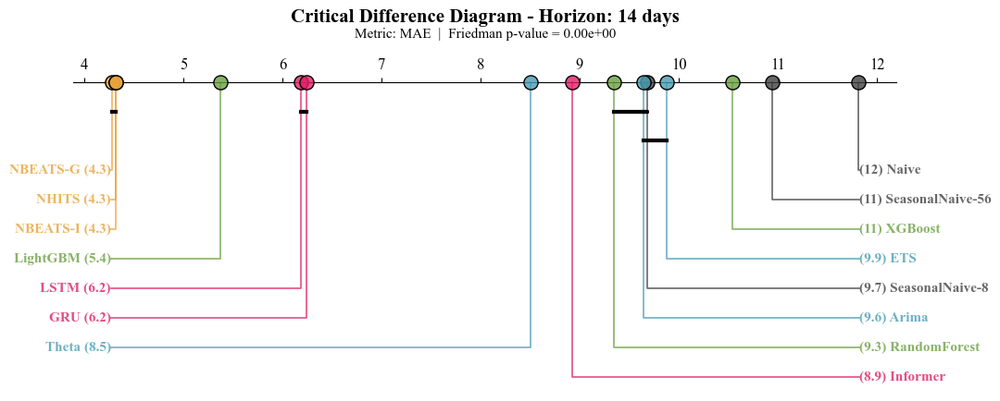


--- Processando Horizonte: 1days ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_1days.png


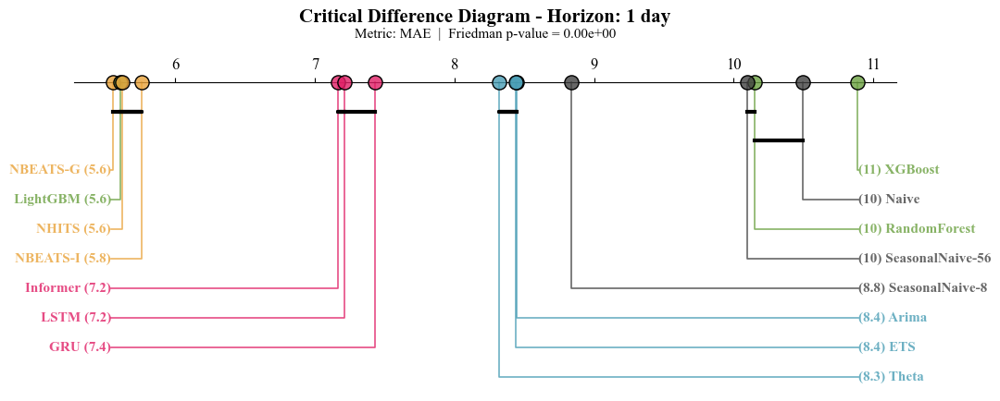


--- Processando Horizonte: 30days ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_30days.png


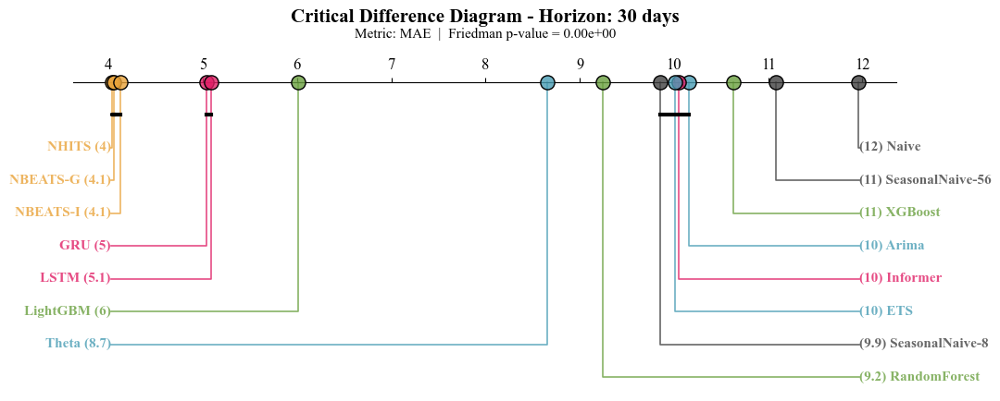


--- Processando Horizonte: 7days ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_7days.png


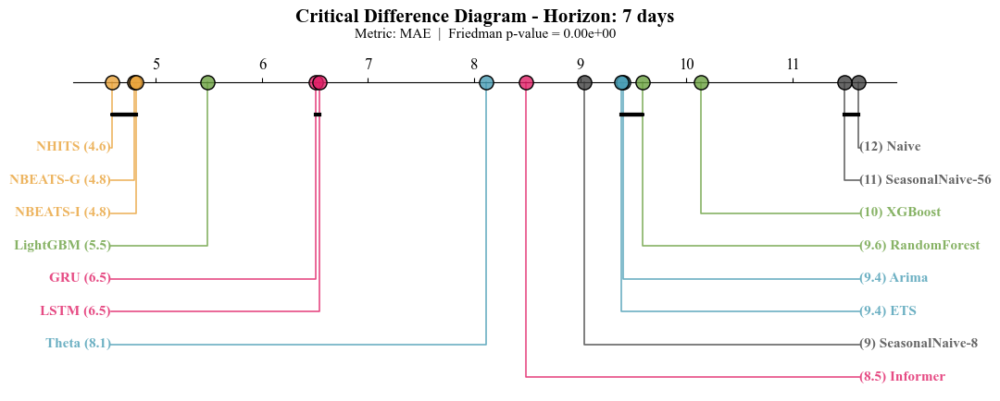

In [160]:
# =========================================================
# 1. CONFIGURAÇÃO GLOBAL (Journal Style - Times New Roman)
# =========================================================
plt.rcdefaults()
mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.size": 12
})

# Definição das categorias e cores
categories = {
    "Statistical": {"Arima", "ETS", "Theta"},
    "Machine Learning": {"RandomForest", "XGBoost", "LightGBM"},
    "Deep Learning": {"LSTM", "GRU", "Informer"},
    "Neural": {"NHITS", "NBEATS-G", "NBEATS-I"},
    "Benchmark": {"Naive", "SeasonalNaive-8", "SeasonalNaive-56"}
}

color_palette = {
    "Statistical": "#489db4cc", "Machine Learning": "#6aa040cc",
    "Deep Learning": "#e01f66cc", "Neural": "#e9a33acc", "Benchmark": "#414141cc"
}

# =========================================================
# 2. LOOP POR HORIZONTE
# =========================================================
horizontes = metrics['horizon'].unique()

for hor in horizontes:
    print(f"\n--- Processando Horizonte: {hor} ---")
    
    # Filtrar dados para o horizonte específico
    df_h = metrics[metrics['horizon'] == hor]
    
    # Pivotar: cada linha é um par (poluente, estacao, cutoff)
    df_pivot = df_h.pivot_table(
        index=['pollutant', 'unique_id', 'cutoff'], 
        columns='model', 
        values='MAE'
    )

    if df_pivot.empty:
        continue

    # --- SOLUÇÃO PARA O KEYERROR ---
    # 1. Resetamos o índice para transformar pollutant, unique_id e cutoff em colunas normais
    # 2. Mas o Nemenyi precisa apenas da matriz de valores (modelos nas colunas)
    # Portanto, vamos criar uma versão "limpa" apenas com os valores numéricos
    df_nemenyi_input = df_pivot.reset_index(drop=True)
    
    # 3. Teste de Friedman (usa a matriz limpa)
    stat, p_val = friedmanchisquare(*[df_nemenyi_input[col] for col in df_nemenyi_input.columns])
    print(f"Friedman p-value: {p_val:.4e}")

    # 4. Teste de Nemenyi (Agora sem colunas de índice que causam conflito)
    # Passamos o DataFrame com drop_index=True ou apenas os valores
    data_nemenyi = sp.posthoc_nemenyi_friedman(df_nemenyi_input)

    # 5. Cálculo dos Ranks Médios
    ranks = df_pivot.rank(axis=1, ascending=True).mean().sort_values()

    # 6. Mapeamento de Hue (Categorias)
    hue = pd.Series(index=ranks.index, dtype="object")
    for model in ranks.index:
        found = False
        for cat, models in categories.items():
            if model in models:
                hue[model] = cat
                found = True
        if not found: hue[model] = "Other"

    # 7. Plotagem do CD Diagram
    fig, ax = plt.subplots(figsize=(11, 4.5))
    
    # Extrair número do horizonte (remove 'days')
    hor_num = int(hor.replace("days", ""))
    # Formatação elegante (singular/plural correto)
    hor_label = f"{hor_num} day" if hor_num == 1 else f"{hor_num} days"
    title_main = f"Critical Difference Diagram - Horizon: {hor_label}"
    subtitle = f"Metric: MAE  |  Friedman p-value = {p_val:.2e}"

    ax.set_title(title_main, fontweight='bold', fontsize=15, pad=35, family='serif')
    ax.text(0.5, 1.09, subtitle, transform=ax.transAxes, ha='center', fontsize=11, family='serif')

    # Gerar o diagrama
    sp.critical_difference_diagram(
        ranks,
        data_nemenyi,
        ax=ax,
        hue=hue,
        color_palette=color_palette,
        label_props={"fontsize": 11, "fontweight": "bold"},
        marker_props={"s": 120, "edgecolor": "black", "linewidths": 1},
        elbow_props={"linewidth": 1.2},
        crossbar_props={"linewidth": 3, "color": "black"},
        text_h_margin=0.01
    )

    # Forçar a fonte Times New Roman em todos os elementos do gráfico
    for text in ax.findobj(match=mpl.text.Text):
        text.set_fontfamily("serif")
        text.set_fontname("Times New Roman")

    plt.tight_layout()
    
    # Salvar cada horizonte em um arquivo separado
    file_name = f"CD_Diagram_MAE_{hor}.png"
    plt.savefig(file_name, format="png", bbox_inches="tight")
    print(f"Salvo: {file_name}")
    
    plt.show()

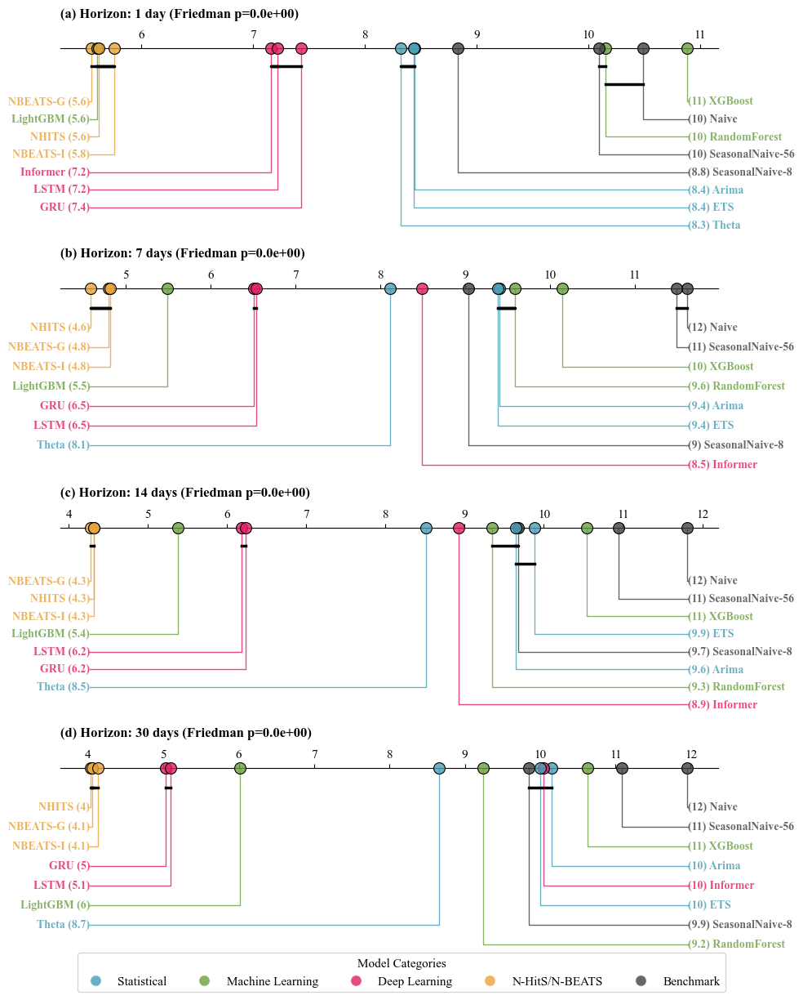

In [134]:
# =========================================================
# 1. CONFIGURAÇÃO GLOBAL (Elsevier/Journal Style)
# =========================================================
plt.rcdefaults()
mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.size": 11 # Tamanho padrão para leitura em papel
})

# Categorias e Cores (Mesma lógica anterior)
categories_map = {
    "Statistical": {"Arima", "ETS", "Theta"},
    "Machine Learning": {"RandomForest", "XGBoost", "LightGBM"},
    "Deep Learning": {"LSTM", "GRU", "Informer"},
    "N-HitS/N-BEATS": {"NHITS", "NBEATS-G", "NBEATS-I"},
    "Benchmark": {"Naive", "SeasonalNaive-8", "SeasonalNaive-56"}
}

color_palette = {
    "Statistical": "#489db4cc", "Machine Learning": "#6aa040cc",
    "Deep Learning": "#e01f66cc", "N-HitS/N-BEATS": "#e9a33acc", "Benchmark": "#414141cc"
}

horizontes = sorted(metrics['horizon'].unique(), key=lambda x: int(x.replace("days", "")))
n_hor = len(horizontes)

# =========================================================
# 2. CRIAÇÃO DA FIGURA MULTI-PAINEL
# =========================================================
# Ajuste o figsize conforme o número de horizontes (ex: 5 polegadas de altura por plot)
fig, axes = plt.subplots(nrows=n_hor, ncols=1, figsize=(10, 4 * n_hor *0.8))

# Se houver apenas 1 horizonte, axes não será uma lista, então forçamos
if n_hor == 1: axes = [axes]

letters = ["(a)", "(b)", "(c)", "(d)"] # Para identificar os subplots

for i, (hor, ax) in enumerate(zip(horizontes, axes)):
    
    # Processamento de dados (seu pipeline original)
    df_h = metrics[metrics['horizon'] == hor]
    df_pivot = df_h.pivot_table(index=['pollutant', 'unique_id', 'cutoff'], 
                                columns='model', values='MAE').dropna()
    
    if df_pivot.empty: continue

    df_nemenyi_input = df_pivot.reset_index(drop=True)
    stat, p_val = friedmanchisquare(*[df_nemenyi_input[col] for col in df_nemenyi_input.columns])
    data_nemenyi = sp.posthoc_nemenyi_friedman(df_nemenyi_input)
    ranks = df_pivot.rank(axis=1, ascending=True).mean().sort_values()

    # Mapeamento de Categorias para o gráfico atual
    hue = pd.Series(index=ranks.index, dtype="object")
    for model in ranks.index:
        hue[model] = next((cat for cat, mods in categories_map.items() if model in mods), "Other")

    # Formatação do Título do Subplot
    hor_num = int(hor.replace("days", ""))
    hor_label = f"{hor_num} day" if hor_num == 1 else f"{hor_num} days"
    
    # Título do Subplot posicionado de forma limpa
    ax.set_title(f"{letters[i]} Horizon: {hor_label} (Friedman p={p_val:.1e})", 
                 loc='left', fontweight='bold', fontsize=12, pad=20)

    # Gerar o diagrama no eixo específico
    sp.critical_difference_diagram(
        ranks, data_nemenyi, ax=ax, hue=hue, color_palette=color_palette,
        label_props={"fontsize": 10, "fontweight": "bold"},
        marker_props={"s": 100, "edgecolor": "black", "linewidths": 0.8},
        elbow_props={"linewidth": 1.0},
        crossbar_props={"linewidth": 2.5, "color": "black"},
        text_h_margin=0.01
    )

# =========================================================
# 3. LEGENDA GLOBAL E AJUSTES FINAIS
# =========================================================

# Criar elementos para a legenda global
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', label=cat,
                          markerfacecolor=color, markersize=10) 
                   for cat, color in color_palette.items()]

# Posicionar a legenda no fundo (ou topo) da figura inteira
fig.legend(handles=legend_elements, loc='lower center', ncol=5, 
           bbox_to_anchor=(0.5, 0.02), frameon=True, fontsize=11, title="Model Categories")

# Forçar Times New Roman em tudo
for text in fig.findobj(match=mpl.text.Text):
    text.set_fontname("Times New Roman")

# Ajuste de layout para evitar sobreposição (deixe espaço na base para a legenda)
plt.tight_layout(rect=[0, 0.05, 1, 0.98])

# Salvar em alta resolução (TIFF ou PDF são ideais para Elsevier)
plt.savefig("CD_Diagram_Composite.png", dpi=1000, bbox_inches="tight")
plt.show()

### DM + t-Test

In [185]:
# =========================================================
# 1. FUNÇÃO DM (HLN + HAC)
# =========================================================
def diebold_mariano_test(target, forecast_m1, forecast_m2, h=1):
    e1 = np.abs(target - forecast_m1)
    e2 = np.abs(target - forecast_m2)
    d = e1 - e2
    T = len(d)

    if T <= h:
        return np.nan, np.nan

    def autocovariance(x, lag):
        if lag == 0:
            return np.var(x, ddof=1)
        return np.cov(x[lag:], x[:-lag])[0][1]

    # Newey–West variance (Bartlett kernel)
    v_hat = autocovariance(d, 0)
    for k in range(1, h):
        v_hat += 2 * (1 - k/h) * autocovariance(d, k)

    if v_hat <= 0:
        return np.nan, np.nan

    dm_stat = np.mean(d) / np.sqrt(v_hat / T)

    # HLN correction
    hln = np.sqrt((T + 1 - 2*h + (h/T)*(h-1)) / T)
    dm_stat_hln = hln * dm_stat

    p_value = 2 * stats.t.sf(np.abs(dm_stat_hln), df=T-1)

    return dm_stat_hln, p_value


# =========================================================
# 2. CONFIGURAÇÕES
# =========================================================
poluentes = ['go3', 'pm10', 'pm2p5', 'no2']
horizontes = {'1days': 8, '7days': 56, '14days': 112, '30days': 240}
base_path = r'..\Masters 26\Results\RQ1\full'

todos_modelos = [
    'NHITS', 'NBEATS-G', 'NBEATS-I', 'Arima', 'ETS', 'Theta',
    'LightGBM', 'RandomForest', 'XGBoost', 'GRU', 'LSTM', 'Informer',
    'Naive', 'SeasonalNaive-8', 'SeasonalNaive-56'
]

resultados = []

# =========================================================
# 3. LOOP PRINCIPAL
# =========================================================
for pol in poluentes:
    for hor, h in horizontes.items():

        file_path = os.path.join(base_path, f'{pol}_{hor}.csv')
        if not os.path.exists(file_path):
            continue

        df = pd.read_csv(file_path)

        # Ordenação correta
        df = df.sort_values(['unique_id', 'cutoff', 'ds'])

        # =====================================================
        # AGRUPAR POR CÉLULA (UNIDADE CORRETA)
        # =====================================================
        grupos_celula = df.groupby('unique_id')

        for m1, m2 in itertools.combinations(todos_modelos, 2):

            if m1 not in df.columns or m2 not in df.columns:
                continue

            dm_stats_celulas = []

            for uid, df_cell in grupos_celula:

                # Concatenar todos os cutoffs dessa célula
                y_true = df_cell['y'].values
                y_m1 = df_cell[m1].values
                y_m2 = df_cell[m2].values

                if len(y_true) <= h:
                    continue

                stat, p = diebold_mariano_test(
                    y_true, y_m1, y_m2, h=h
                )

                if not np.isnan(stat):
                    dm_stats_celulas.append(stat)

            if len(dm_stats_celulas) < 3:
                continue

            dm_stats_celulas = np.array(dm_stats_celulas)

            # =====================================================
            # TESTE t SOBRE MÉDIA DAS CÉLULAS
            # =====================================================
            t_stat, p_val = stats.ttest_1samp(dm_stats_celulas, 0)

            resultados.append({
                'Pollutant': pol.upper(),
                'Horizon': hor,
                'Model1': m1,
                'Model2': m2,
                'Mean_DM_Cell': np.mean(dm_stats_celulas),
                't_stat_cell': t_stat,
                'p_value_cell': p_val,
                'N_cells': len(dm_stats_celulas)
            })


# =========================================================
# 4. HOLM-BONFERRONI POR EXPERIMENTO
# =========================================================
df_final = pd.DataFrame(resultados)

def apply_holm(group):
    rejected, p_corr, _, _ = multipletests(
        group['p_value_cell'], alpha=0.05, method='holm'
    )
    group['p_value_corrected'] = p_corr
    group['Significant_05'] = rejected
    return group

df_final = (
    df_final
    .groupby(['Pollutant', 'Horizon'], group_keys=False)
    .apply(apply_holm)
)

# =========================================================
# 5. DETERMINAR VENCEDOR
# =========================================================
def determine_winner(row):
    if not row['Significant_05']:
        return "Tie (Equal)"
    return row['Model1'] if row['Mean_DM_Cell'] < 0 else row['Model2']

df_final['Superior_Model'] = df_final.apply(determine_winner, axis=1)

df_final.to_csv("DM_Tests_Cell_Level_Holm_Corrected.csv", index=False)

print("✅ DM por célula concluído corretamente.")

✅ DM por célula concluído corretamente.


C:\Users\gustavo.filho\AppData\Local\Temp\ipykernel_27556\1941558697.py:134: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [211]:
def plot_universal_dominance_cell_level(results_df, target_pollutant, focal_model='NHITS'):
    
    df_temp = results_df[
        results_df['Pollutant'] == target_pollutant.upper()
    ].copy()
    
    if df_temp.empty:
        return None

    mask = (
        (df_temp['Model1'] == focal_model) |
        (df_temp['Model2'] == focal_model)
    )
    
    df_filtered = df_temp[mask].copy()

    if df_filtered.empty:
        return None

    # -----------------------------------------------------
    # Determinar oponente e score
    # -----------------------------------------------------
    def get_score(row):
        opponent = row['Model2'] if row['Model1'] == focal_model else row['Model1']
        
        if row['Superior_Model'] == focal_model:
            score = 1
        elif row['Superior_Model'] == 'Tie (Equal)':
            score = 0
        else:
            score = -1
            
        return pd.Series([opponent, score], index=['Opponent', 'Score'])

    df_filtered[['Opponent', 'Score']] = df_filtered.apply(get_score, axis=1)

    # -----------------------------------------------------
    # Pivotagem
    # -----------------------------------------------------
    pivot_heat = (
        df_filtered
        .groupby(['Opponent', 'Horizon'])['Score']
        .mean()
        .unstack()
    )

    if pivot_heat.empty:
        return None

    # Ordem fixa
    models_order = [
        'NHITS', 'NBEATS-G', 'NBEATS-I', 
        'GRU', 'LSTM', 'Informer',
        'LightGBM', 'RandomForest', 'XGBoost',
        # 'Arima', 'ETS', 'Theta',
        # 'Naive', 'SeasonalNaive-8', 'SeasonalNaive-56'
    ]

    y_order = [m for m in reversed(models_order)
               if m in pivot_heat.index and m != focal_model]

    h_order = ['1days', '7days', '14days', '30days']

    pivot_heat = pivot_heat.reindex(
        index=y_order,
        columns=[h for h in h_order if h in pivot_heat.columns]
    )

    # -----------------------------------------------------
    # Texto (↑ = superior, = empate, ↓ inferior)
    # -----------------------------------------------------
    label_map = {-1: "↓", 0: "=", 1: "↑"}
    text_matrix = np.vectorize(
        lambda x: label_map.get(int(x), "") if not np.isnan(x) else ""
    )(pivot_heat.values)

    # -----------------------------------------------------
    # Plot
    # -----------------------------------------------------
    fig = go.Figure(data=go.Heatmap(
        z=pivot_heat.values,
        x=pivot_heat.columns,
        y=pivot_heat.index,
        zmin=-1,
        zmax=1,
        colorscale=[[0.0, "#A74752"],
                    [0.5, "#F7F7F7"],
                    [1.0, "#2FB669"]],
        showscale=False,
        text=text_matrix,
        texttemplate="%{text}",
        textfont=dict(family="Times New Roman", size=14),
        xgap=4,
        ygap=4
    ))

    fig.update_layout(
        title=f"<b>Statistical Dominance (Cell-Level DM): {focal_model}</b>"
              f"<br><sup>Pollutant: {target_pollutant.upper()} | Holm Corrected</sup>",
        font=dict(family="Times New Roman", size=14),
        width=500,
        height=420,
        plot_bgcolor="white"
    )

    return fig

# -----------------------------------------------------
# -----------------------------------------------------

def generate_universal_dominance_figure(
    results_df,
    base_model='NHITS',
    save=False,
    scale=4
):

    pollutants = ['PM10', 'PM2P5', 'NO2', 'GO3']
    subplot_titles = [
        r'$\text{PM}_{10}$',
        r'$\text{PM}_{2.5}$',
        r'$\text{NO}_{2}$',
        r'$\text{O}_{3}$'
    ]

    figs = []

    # -----------------------------------------------------
    # Gerar heatmaps individuais
    # -----------------------------------------------------
    for pol in pollutants:
        fig_temp = plot_universal_dominance_cell_level(
            results_df,
            pol,
            focal_model=base_model
        )
        figs.append(fig_temp)

    # -----------------------------------------------------
    # Criar Subplots
    # -----------------------------------------------------
    fig = make_subplots(
        rows=2,
        cols=2,
        subplot_titles=subplot_titles,
        shared_xaxes=True,
        shared_yaxes=True,
        vertical_spacing=0.07,
        horizontal_spacing=0.05
    )

    positions = [(1,1), (1,2), (2,1), (2,2)]

    for f, pos in zip(figs, positions):
        if f is None:
            continue
        for trace in f.data:
            fig.add_trace(trace, row=pos[0], col=pos[1])

    # -----------------------------------------------------
    # Layout Global
    # -----------------------------------------------------
    fig.update_layout(
        font=dict(family="Times New Roman", size=14),
        plot_bgcolor="white",
        width=900,
        height=800,
        margin=dict(t=80, b=60, l=40, r=40),
        title={
            'text': f"<b>Universal Dominance: {base_model} Base</b>",
            'y': 0.99,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        }
    )

    # -----------------------------------------------------
    # Ajustar títulos dos subplots
    # -----------------------------------------------------
    for annot in fig.layout.annotations:
        if annot.text in subplot_titles:
            annot.font.size = 18
            annot.y += 0.01

    # -----------------------------------------------------
    # Legenda Geral
    # -----------------------------------------------------
    fig.add_annotation(
        text="Legend: (↑) Superior  (=) No Significant Difference  (↓) Inferior",
        x=0.5,
        y=1.08,
        xref="paper",
        yref="paper",
        showarrow=False,
        font=dict(size=13, color="gray"),
        xanchor="center"
    )

    fig.update_xaxes(showgrid=False)
    fig.update_yaxes(showgrid=False)

    # -----------------------------------------------------
    # Salvar opcionalmente
    # -----------------------------------------------------
    if save:
        filename = f"universal_dominance_{base_model}.png"
        fig.write_image(filename, scale=scale)
        print(f"Salvo: {filename}")

    return fig

# -----------------------------------------------------
# -----------------------------------------------------

fig = generate_universal_dominance_figure(
    df_final,
    base_model='NHITS',
    save=True,
    scale=6
)

fig.show()

Salvo: universal_dominance_NHITS.png


In [208]:
def plot_universal_dominance_cell_level(results_df, target_pollutant, focal_model='NHITS'):
    
    df_temp = results_df[
        results_df['Pollutant'] == target_pollutant.upper()
    ].copy()
    
    if df_temp.empty:
        return None

    mask = (
        (df_temp['Model1'] == focal_model) |
        (df_temp['Model2'] == focal_model)
    )
    
    df_filtered = df_temp[mask].copy()

    if df_filtered.empty:
        return None

    # -----------------------------------------------------
    # Determinar oponente e score
    # -----------------------------------------------------
    def get_score(row):
        opponent = row['Model2'] if row['Model1'] == focal_model else row['Model1']
        
        if row['Superior_Model'] == focal_model:
            score = 1
        elif row['Superior_Model'] == 'Tie (Equal)':
            score = 0
        else:
            score = -1
            
        return pd.Series([opponent, score], index=['Opponent', 'Score'])

    df_filtered[['Opponent', 'Score']] = df_filtered.apply(get_score, axis=1)

    # -----------------------------------------------------
    # Pivotagem
    # -----------------------------------------------------
    pivot_heat = (
        df_filtered
        .groupby(['Opponent', 'Horizon'])['Score']
        .mean()
        .unstack()
    )

    if pivot_heat.empty:
        return None

    # Ordem fixa
    models_order = [
        'NHITS', 'NBEATS-G', 'NBEATS-I', 
        'GRU', 'LSTM', 'Informer',
        'LightGBM', 'RandomForest', 'XGBoost',
        'Arima', 'ETS', 'Theta',
        'Naive', 'SeasonalNaive-8', 'SeasonalNaive-56'
    ]

    y_order = [m for m in reversed(models_order)
               if m in pivot_heat.index and m != focal_model]

    h_order = ['1days', '7days', '14days', '30days']

    pivot_heat = pivot_heat.reindex(
        index=y_order,
        columns=[h for h in h_order if h in pivot_heat.columns]
    )

    # -----------------------------------------------------
    # Texto (↑ = superior, = empate, ↓ inferior)
    # -----------------------------------------------------
    label_map = {-1: "↓", 0: "=", 1: "↑"}
    text_matrix = np.vectorize(
        lambda x: label_map.get(int(x), "") if not np.isnan(x) else ""
    )(pivot_heat.values)

    # -----------------------------------------------------
    # Plot
    # -----------------------------------------------------
    fig = go.Figure(data=go.Heatmap(
        z=pivot_heat.values,
        x=pivot_heat.columns,
        y=pivot_heat.index,
        zmin=-1,
        zmax=1,
        colorscale=[[0.0, "#A74752"],
                    [0.5, "#F7F7F7"],
                    [1.0, "#2FB669"]],
        showscale=False,
        text=text_matrix,
        texttemplate="%{text}",
        textfont=dict(family="Times New Roman", size=14),
        xgap=4,
        ygap=4
    ))

    fig.update_layout(
        title=f"<b>Statistical Dominance (Cell-Level DM): {focal_model}</b>"
              f"<br><sup>Pollutant: {target_pollutant.upper()} | Holm Corrected</sup>",
        font=dict(family="Times New Roman", size=14),
        width=500,
        height=420,
        plot_bgcolor="white"
    )

    return fig

# -----------------------------------------------------
# -----------------------------------------------------

def generate_universal_dominance_figure(
    results_df,
    base_model='NHITS',
    save=False,
    scale=4
):

    pollutants = ['PM10', 'PM2P5', 'NO2', 'GO3']
    subplot_titles = [
        r'$\text{PM}_{10}$',
        r'$\text{PM}_{2.5}$',
        r'$\text{NO}_{2}$',
        r'$\text{O}_{3}$'
    ]

    figs = []

    # -----------------------------------------------------
    # Gerar heatmaps individuais
    # -----------------------------------------------------
    for pol in pollutants:
        fig_temp = plot_universal_dominance_cell_level(
            results_df,
            pol,
            focal_model=base_model
        )
        figs.append(fig_temp)

    # -----------------------------------------------------
    # Criar Subplots
    # -----------------------------------------------------
    fig = make_subplots(
        rows=2,
        cols=2,
        subplot_titles=subplot_titles,
        shared_xaxes=True,
        shared_yaxes=True,
        vertical_spacing=0.05,
        horizontal_spacing=0.05
    )

    positions = [(1,1), (1,2), (2,1), (2,2)]

    for f, pos in zip(figs, positions):
        if f is None:
            continue
        for trace in f.data:
            fig.add_trace(trace, row=pos[0], col=pos[1])

    # -----------------------------------------------------
    # Layout Global
    # -----------------------------------------------------
    fig.update_layout(
        font=dict(family="Times New Roman", size=14),
        plot_bgcolor="white",
        width=900,
        height=1000,
        margin=dict(t=80, b=60, l=40, r=40),
        title={
            'text': f"<b>Universal Dominance: {base_model} Base</b>",
            'y': 0.99,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        }
    )

    # -----------------------------------------------------
    # Ajustar títulos dos subplots
    # -----------------------------------------------------
    for annot in fig.layout.annotations:
        if annot.text in subplot_titles:
            annot.font.size = 18
            annot.y += 0.01

    # -----------------------------------------------------
    # Legenda Geral
    # -----------------------------------------------------
    fig.add_annotation(
        text="Legend: (↑) Superior  (=) No Significant Difference  (↓) Inferior",
        x=0.4515,
        y=1.065,
        xref="paper",
        yref="paper",
        showarrow=False,
        font=dict(size=13, color="gray"),
        xanchor="center"
    )

    fig.update_xaxes(showgrid=False)
    fig.update_yaxes(showgrid=False)

    # -----------------------------------------------------
    # Salvar opcionalmente
    # -----------------------------------------------------
    if save:
        filename = f"universal_dominance_{base_model}.png"
        fig.write_image(filename, scale=scale)
        print(f"Salvo: {filename}")

    return fig

# -----------------------------------------------------
# -----------------------------------------------------

fig = generate_universal_dominance_figure(
    df_final,
    base_model='NHITS',
    save=True,
    scale=6
)

fig.show()

Salvo: universal_dominance_NHITS.png


### DM + Wilcoxon

In [166]:
# =========================================================
# 1. FUNÇÃO DM (HLN + HAC)
# =========================================================
def diebold_mariano_test(target, forecast_m1, forecast_m2, h=1):
    e1 = np.abs(target - forecast_m1)
    e2 = np.abs(target - forecast_m2)
    d = e1 - e2
    T = len(d)

    if T <= h:
        return np.nan, np.nan

    def autocovariance(x, lag):
        if lag == 0:
            return np.var(x, ddof=1)
        return np.cov(x[lag:], x[:-lag])[0][1]

    # Newey–West variance (Bartlett kernel)
    v_hat = autocovariance(d, 0)
    for k in range(1, h):
        v_hat += 2 * (1 - k/h) * autocovariance(d, k)

    if v_hat <= 0:
        return np.nan, np.nan

    dm_stat = np.mean(d) / np.sqrt(v_hat / T)

    # HLN correction
    hln = np.sqrt((T + 1 - 2*h + (h/T)*(h-1)) / T)
    dm_stat_hln = hln * dm_stat

    p_value = 2 * stats.t.sf(np.abs(dm_stat_hln), df=T-1)

    return dm_stat_hln, p_value


# =========================================================
# 2. CONFIGURAÇÕES
# =========================================================
poluentes = ['go3', 'pm10', 'pm2p5', 'no2']
horizontes = {'1days': 8, '7days': 56, '14days': 112, '30days': 240}
base_path = r'..\Masters 26\Results\RQ1\full'

todos_modelos = [
    'NHITS', 'NBEATS-G', 'NBEATS-I', 'Arima', 'ETS', 'Theta',
    'LightGBM', 'RandomForest', 'XGBoost', 'GRU', 'LSTM', 'Informer',
    'Naive', 'SeasonalNaive-8', 'SeasonalNaive-56'
]

resultados = []

from scipy.stats import wilcoxon

# =========================================================
# 3. LOOP PRINCIPAL
# =========================================================
for pol in poluentes:
    for hor, h in horizontes.items():

        file_path = os.path.join(base_path, f'{pol}_{hor}.csv')
        if not os.path.exists(file_path):
            continue

        df = pd.read_csv(file_path)

        df = df.sort_values(['unique_id', 'cutoff', 'ds'])
        grupos_celula = df.groupby('unique_id')

        for m1, m2 in itertools.combinations(todos_modelos, 2):

            if m1 not in df.columns or m2 not in df.columns:
                continue

            dm_stats_celulas = []

            for uid, df_cell in grupos_celula:

                y_true = df_cell['y'].values
                y_m1 = df_cell[m1].values
                y_m2 = df_cell[m2].values

                if len(y_true) <= h:
                    continue

                stat, p = diebold_mariano_test(
                    y_true, y_m1, y_m2, h=h
                )

                if not np.isnan(stat):
                    dm_stats_celulas.append(stat)

            if len(dm_stats_celulas) < 3:
                continue

            dm_stats_celulas = np.array(dm_stats_celulas)

            # =====================================================
            # WILCOXON SIGNED-RANK TEST
            # =====================================================
            try:
                w_stat, p_val = wilcoxon(
                    dm_stats_celulas,
                    zero_method='wilcox',
                    alternative='two-sided'
                )
            except ValueError:
                # ocorre se todos valores forem iguais
                continue

            resultados.append({
                'Pollutant': pol.upper(),
                'Horizon': hor,
                'Model1': m1,
                'Model2': m2,
                'Median_DM_Cell': np.median(dm_stats_celulas),
                'W_stat': w_stat,
                'p_value_cell': p_val,
                'N_cells': len(dm_stats_celulas)
            })


# =========================================================
# 4. HOLM-BONFERRONI POR EXPERIMENTO
# =========================================================
df_final = pd.DataFrame(resultados)

def apply_holm(group):
    rejected, p_corr, _, _ = multipletests(
        group['p_value_cell'], alpha=0.05, method='holm'
    )
    group['p_value_corrected'] = p_corr
    group['Significant_05'] = rejected
    return group

df_final = (
    df_final
    .groupby(['Pollutant', 'Horizon'], group_keys=False)
    .apply(apply_holm)
)

# =========================================================
# 5. DETERMINAR VENCEDOR
# =========================================================
def determine_winner(row):
    if not row['Significant_05']:
        return "Tie (Equal)"
    return row['Model1'] if row['Median_DM_Cell'] < 0 else row['Model2']

df_final['Superior_Model'] = df_final.apply(determine_winner, axis=1)

df_final.to_csv("DM_Tests_Cell_Level_Holm_Wilcoxon.csv", index=False)

print("✅ DM por célula concluído corretamente.")

✅ DM por célula concluído corretamente.


C:\Users\gustavo.filho\AppData\Local\Temp\ipykernel_27556\3718563738.py:138: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [179]:
def plot_universal_dominance_cell_level(results_df, target_pollutant, focal_model='NHITS'):
    
    df_temp = results_df[
        results_df['Pollutant'] == target_pollutant.upper()
    ].copy()
    
    if df_temp.empty:
        return None

    mask = (
        (df_temp['Model1'] == focal_model) |
        (df_temp['Model2'] == focal_model)
    )
    
    df_filtered = df_temp[mask].copy()

    if df_filtered.empty:
        return None

    # -----------------------------------------------------
    # Determinar oponente e score
    # -----------------------------------------------------
    def get_score(row):
        opponent = row['Model2'] if row['Model1'] == focal_model else row['Model1']
        
        if row['Superior_Model'] == focal_model:
            score = 1
        elif row['Superior_Model'] == 'Tie (Equal)':
            score = 0
        else:
            score = -1
            
        return pd.Series([opponent, score], index=['Opponent', 'Score'])

    df_filtered[['Opponent', 'Score']] = df_filtered.apply(get_score, axis=1)

    # -----------------------------------------------------
    # Pivotagem
    # -----------------------------------------------------
    pivot_heat = (
        df_filtered
        .groupby(['Opponent', 'Horizon'])['Score']
        .mean()
        .unstack()
    )

    if pivot_heat.empty:
        return None

    # Ordem fixa
    models_order = [
        'NHITS', 'NBEATS-G', 'NBEATS-I', 
        'GRU', 'LSTM', 'Informer',
        'LightGBM', 'RandomForest', 'XGBoost',
        # 'Arima', 'ETS', 'Theta',
        # 'Naive', 'SeasonalNaive-8', 'SeasonalNaive-56'
    ]

    y_order = [m for m in reversed(models_order)
               if m in pivot_heat.index and m != focal_model]

    h_order = ['1days', '7days', '14days', '30days']

    pivot_heat = pivot_heat.reindex(
        index=y_order,
        columns=[h for h in h_order if h in pivot_heat.columns]
    )

    # -----------------------------------------------------
    # Texto (↑ = superior, = empate, ↓ inferior)
    # -----------------------------------------------------
    label_map = {-1: "↓", 0: "=", 1: "↑"}
    text_matrix = np.vectorize(
        lambda x: label_map.get(int(x), "") if not np.isnan(x) else ""
    )(pivot_heat.values)

    # -----------------------------------------------------
    # Plot
    # -----------------------------------------------------
    fig = go.Figure(data=go.Heatmap(
        z=pivot_heat.values,
        x=pivot_heat.columns,
        y=pivot_heat.index,
        zmin=-1,
        zmax=1,
        colorscale=[[0.0, "#A74752"],
                    [0.5, "#F7F7F7"],
                    [1.0, "#2FB669"]],
        showscale=False,
        text=text_matrix,
        texttemplate="%{text}",
        textfont=dict(family="Times New Roman", size=14),
        xgap=4,
        ygap=4
    ))

    fig.update_layout(
        title=f"<b>Statistical Dominance (Cell-Level DM): {focal_model}</b>"
              f"<br><sup>Pollutant: {target_pollutant.upper()} | Holm Corrected</sup>",
        font=dict(family="Times New Roman", size=14),
        width=500,
        height=400,
        plot_bgcolor="white"
    )

    return fig

# -----------------------------------------------------
# -----------------------------------------------------

def generate_universal_dominance_figure(
    results_df,
    base_model='NHITS',
    save=False,
    scale=4
):

    pollutants = ['PM10', 'PM2P5', 'NO2', 'GO3']
    subplot_titles = [
        r'$\text{PM}_{10}$',
        r'$\text{PM}_{2.5}$',
        r'$\text{NO}_{2}$',
        r'$\text{O}_{3}$'
    ]

    figs = []

    # -----------------------------------------------------
    # Gerar heatmaps individuais
    # -----------------------------------------------------
    for pol in pollutants:
        fig_temp = plot_universal_dominance_cell_level(
            results_df,
            pol,
            focal_model=base_model
        )
        figs.append(fig_temp)

    # -----------------------------------------------------
    # Criar Subplots
    # -----------------------------------------------------
    fig = make_subplots(
        rows=2,
        cols=2,
        subplot_titles=subplot_titles,
        shared_xaxes=True,
        shared_yaxes=True,
        vertical_spacing=0.07,
        horizontal_spacing=0.05
    )

    positions = [(1,1), (1,2), (2,1), (2,2)]

    for f, pos in zip(figs, positions):
        if f is None:
            continue
        for trace in f.data:
            fig.add_trace(trace, row=pos[0], col=pos[1])

    # -----------------------------------------------------
    # Layout Global
    # -----------------------------------------------------
    fig.update_layout(
        font=dict(family="Times New Roman", size=14),
        plot_bgcolor="white",
        width=900,
        height=800,
        margin=dict(t=80, b=60, l=40, r=40),
        title={
            'text': f"<b>Universal Dominance Heatmaps: {base_model} Base</b>",
            'y': 0.99,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        }
    )

    # -----------------------------------------------------
    # Ajustar títulos dos subplots
    # -----------------------------------------------------
    for annot in fig.layout.annotations:
        if annot.text in subplot_titles:
            annot.font.size = 18
            annot.y += 0.01

    # -----------------------------------------------------
    # Legenda Geral
    # -----------------------------------------------------
    fig.add_annotation(
        text="Legend: (↑) Superior  (=) No Significant Difference  (↓) Inferior",
        x=0.5,
        y=1.08,
        xref="paper",
        yref="paper",
        showarrow=False,
        font=dict(size=13, color="gray"),
        xanchor="center"
    )

    fig.update_xaxes(showgrid=False)
    fig.update_yaxes(showgrid=False)

    # -----------------------------------------------------
    # Salvar opcionalmente
    # -----------------------------------------------------
    if save:
        filename = f"universal_dominance_{base_model}.png"
        fig.write_image(filename, scale=scale)
        print(f"Salvo: {filename}")

    return fig

# -----------------------------------------------------
# -----------------------------------------------------

fig = generate_universal_dominance_figure(
    df_final,
    base_model='NHITS',
    save=True,
    scale=6
)

fig.show()

Salvo: universal_dominance_NHITS.png


### Metrics Table

In [395]:
table_metrics = metrics.copy(deep=True)

table_metrics = (
    metrics
    .groupby(['horizon', 'model'])
    .agg(
        MAE_mean=('MAE', 'mean'),
        MAE_std=('MAE', 'std'),
        RMSE_mean=('RMSE', 'mean'),
        RMSE_std=('RMSE', 'std'),
        sMAPE_mean=('sMAPE', 'mean'),
        sMAPE_std=('sMAPE', 'std'),
    )
    .reset_index()
)

# Ordenar por horizonte e MAE
table_metrics = table_metrics.sort_values(
    by=["horizon", "MAE_mean"],
    ascending=[True, True]
)

# Selecionar versão numérica
final_table_numeric = table_metrics[
    [
        "model",
        "horizon",
        "MAE_mean",
        "RMSE_mean",
        "sMAPE_mean", 
    ]
]

final_table_numeric = final_table_numeric.query("horizon == '1days'")
final_table_numeric.to_excel(r'metricallyyy.xlsx')
final_table_numeric

,model,horizon,MAE_mean,RMSE_mean,sMAPE_mean
23,NHITS,1days,4.376501e-09,5.241520e-09,0.368495
21,NBEATS-G,1days,4.426725e-09,5.289501e-09,0.366766
22,NBEATS-I,1days,4.466920e-09,5.332026e-09,0.371818
20,LightGBM,1days,4.596230e-09,5.466207e-09,0.354840
18,Informer,1days,4.860019e-09,5.727180e-09,0.426440
19,LSTM,1days,5.075217e-09,5.932022e-09,0.417212
17,GRU,1days,5.165283e-09,6.038702e-09,0.424370
15,Arima,1days,5.518997e-09,6.511801e-09,0.453485
28,Theta,1days,5.866775e-09,6.818565e-09,0.443107
27,SeasonalNaive-8,1days,6.041002e-09,7.175056e-09,0.483210


## BumPlot

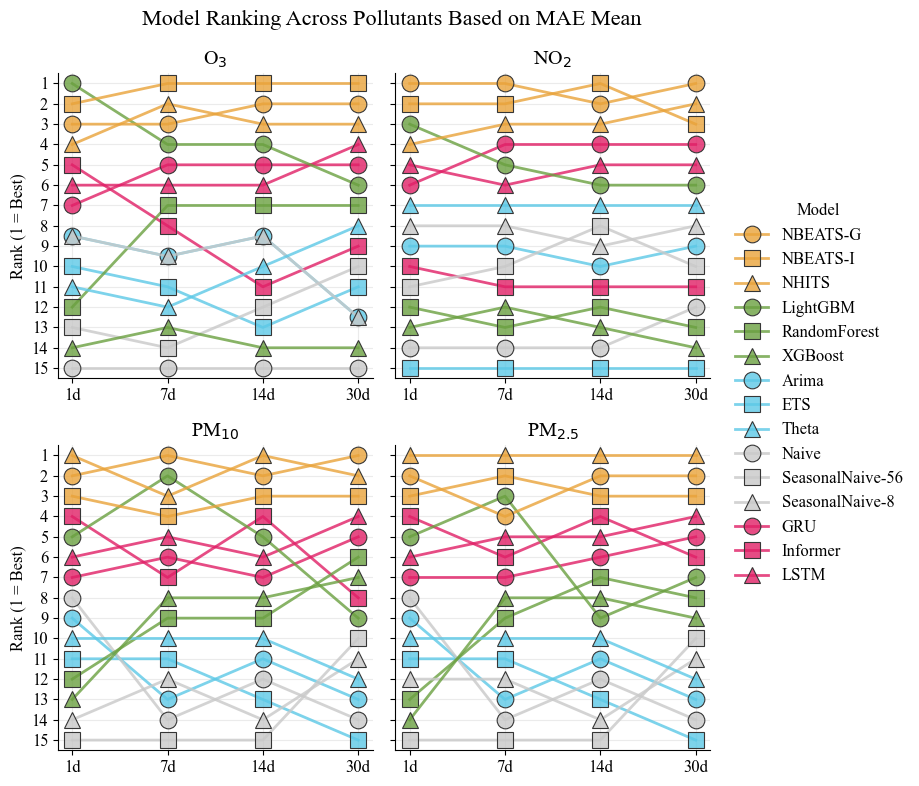

In [ ]:
def plot_bump_all_pollutants(metrics, pollutants, metric="MAE", agg_func: str = 'mean'):

    plt.rcParams.update({
        "font.family": "Times New Roman",
        "font.size": 12
    })

    model_category = {
        'NHITS': 'Neural',
        'NBEATS-I': 'Neural',
        'NBEATS-G': 'Neural',
        'LightGBM': 'ML',
        'RandomForest': 'ML',
        'XGBoost': 'ML',
        'Theta': 'Stats',
        'Arima': 'Stats',
        'ETS': 'Stats',
        'Naive': 'Benchmark',
        'SeasonalNaive-8': 'Benchmark',
        'SeasonalNaive-56': 'Benchmark',
        'GRU': 'dl',
        'LSTM': 'dl',
        'Informer': 'dl',
    }

    color_map = {
        'Neural': "#e9a33acc",
        'ML': '#6aa040cc',
        'Stats': '#5cc8e6cc',
        'Benchmark': "#c9c9c9cc",
        'dl': "#e01f66cc",
        'Other': '#000000'
    }

    category_markers = ['o', 's', '^']

    # ==============================
    # PREPARE DATA (once)
    # ==============================

    df = (
        metrics
        .groupby(["pollutant", "horizon", "model"], observed=False)[metric]
        .agg(agg_func)
        .reset_index()
    )

    df["horizon"] = df["horizon"].str.replace("days", "", regex=False)
    df["horizon"] = df["horizon"].astype(int)

    horizons = sorted(df["horizon"].unique())
    horizon_labels = [f"{h}d" for h in horizons]
    x_numeric = np.arange(len(horizons))

    # ==============================
    # CREATE SUBPLOTS
    # ==============================

    fig, axes = plt.subplots(2, 2, figsize=(8, 8), sharey=True)
    axes = axes.flatten()

    handles = []
    labels = []

    for ax, pollutant in zip(axes, pollutants):

        pollutant_display = {
            "no2": r"NO$_2$",
            "pm10": r"PM$_{10}$",
            "pm2p5": r"PM$_{2.5}$",
            "go3": r"O$_{3}$",
        }

        df_pol = df[df["pollutant"] == pollutant].copy()
        df_pol = df_pol.sort_values("horizon")

        df_pol["rank"] = (
            df_pol
            .groupby("horizon", observed=False)[metric]
            .rank(method="average", ascending=True)
        )

        df_bump = (
            df_pol[["model", "horizon", "rank"]]
            .pivot(index="horizon", columns="model", values="rank")
            .reindex(horizons)
        )

        models = df_bump.columns.tolist()
        category_counter = {}

        for model in models:

            category = model_category.get(model, "Other")
            color = color_map.get(category, "#000000")

            if category not in category_counter:
                category_counter[category] = 0

            marker = category_markers[
                category_counter[category] % len(category_markers)
            ]
            category_counter[category] += 1

            y = df_bump[model].values

            line, = ax.plot(
                x_numeric,
                y,
                label=model,
                color=color,
                linewidth=2,
                marker=marker,
                markersize=12,
                markeredgecolor="#363636",
                markeredgewidth=0.8
            )

            # capture legend only once
            if pollutant == pollutants[0]:
                handles.append(line)
                labels.append(model)

        ax.set_title(pollutant_display.get(pollutant, pollutant.upper()))

        ax.set_xticks(x_numeric)
        ax.set_xticklabels(horizon_labels)
        ax.invert_yaxis()
        ax.grid(alpha=0.25)
        ax.spines[["top", "right"]].set_visible(False)

    max_rank = int(
        df.groupby(["pollutant", "horizon"], observed=False)[metric]
        .rank(method="average", ascending=True)
        .max()
    )
    for ax in axes:
        ax.set_ylim(max_rank + 0.5, 0.5)  # força 1 no topo
        ax.set_yticks(range(1, max_rank + 1))

    axes[0].set_ylabel("Rank (1 = Best)")
    axes[2].set_ylabel("Rank (1 = Best)")
    
    # Define ordem desejada das categorias
    category_order = {
        "Neural": 0,
        "ML": 1,
        "Stats": 2,
        "Benchmark": 3,
        "Other": 4
    }

    # Cria lista combinada
    legend_items = list(zip(handles, labels))

    # Ordena baseado na categoria do modelo
    legend_items.sort(
        key=lambda x: category_order.get(model_category.get(x[1], "Other"), 4)
    )

    # Separa novamente
    handles_sorted, labels_sorted = zip(*legend_items)

    fig.legend(
        handles_sorted,
        labels_sorted,
        title="Model",
        bbox_to_anchor=(0.91, 0.5),
        loc="center left",
        frameon=False
    )

    fig.suptitle(
        f"Model Ranking Across Pollutants Based on {metric} {agg_func.capitalize()}",
        fontsize=16,
        y=0.98
    )

    plt.tight_layout(rect=[0, 0, 0.92, 1])
    
    # # SALVAR A IMAGEM AQUI
    # plt.savefig(
    #     "ranking_poluentes.png", 
    #     dpi=600,               # Altíssima resolução
    #     bbox_inches='tight',    # Garante que a legenda lateral não seja cortada
    #     facecolor='white',      # Fundo branco (evita transparência indesejada)
    #     transparent=False
    # )

    plt.show() # O show vem depois do savefig

    return fig, axes

plot_bump_all_pollutants(
    metrics,
    pollutants=["go3", "no2", "pm10", "pm2p5"],
    metric="MAE", 
    agg_func='mean'
);

## Ranking Bubble Plot

In [31]:
metrics_ = metrics.copy()

# ==========================================
# NOVO: FILTRO DE MODELOS
# ==========================================
# Liste aqui apenas os modelos que você quer que apareçam
models_to_keep = [
    'NHITS', 'NBEATS-G', 'NBEATS-I', 
    'GRU', 'LSTM', 'Informer',
    'LightGBM', 'RandomForest', 'XGBoost',
    'Arima', 'ETS', 'Theta',
    'Naive', 'SeasonalNaive-8', 'SeasonalNaive-56',
] 

# Aplicando o filtro
metrics_ = metrics_[metrics_['model'].isin(models_to_keep)]
# ==========================================

# 1. Mapeamento EXATO e Internacionalização das Categorias
model_to_group = {
    'NHITS': 'Neural', 'NBEATS-G': 'Neural', 'NBEATS-I': 'Neural',
    'LightGBM': 'ML', 'RandomForest': 'ML', 'XGBoost': 'ML',
    'Arima': 'Statistical', 'ETS': 'Statistical', 'Theta': 'Statistical',
    'Naive': 'Benchmark', 'SeasonalNaive-56': 'Benchmark', 'SeasonalNaive-8': 'Benchmark',
    'GRU': 'dl', 'LSTM': 'dl', 'Informer': 'dl',
}
# ... o restante do seu código segue igual

group_colors = {
    'Neural': "#e9a33a",
    'ML': "#6aa040",
    'Statistical': '#5cc8e6',
    'Benchmark': "#C9C9C9",
    'dl': "#e01f66",
}

# Gerando o ranking
metrics_['ranking'] = metrics_.groupby(['pollutant', 'horizon', 'unique_id', 'cutoff'])['MAE'].rank(method='dense', ascending=True)
metrics_ = metrics_.groupby(['horizon', 'model', 'ranking']).agg({
    'pollutant': 'count'
}).reset_index()

# 2. Mapeando Grupos e Cores
metrics_['group'] = metrics_['model'].map(model_to_group)
metrics_['color'] = metrics_['group'].map(group_colors)

# 3. Ordenação dos Modelos (Neural -> ML -> Statistical -> Benchmark)
group_order = ['Neural', 'dl', 'ML', 'Statistical', 'Benchmark',]
metrics_['group'] = pd.Categorical(metrics_['group'], categories=group_order, ordered=True)
metrics_ = metrics_.sort_values(by=['group', 'model'], ascending=[False, True])

# Ordenação dos Horizontes
horizon_order = ['1days', '7days', '14days', '30days']
unique_horizons = [h for h in horizon_order if h in metrics_['horizon'].unique()]

figs = []

for horizon in unique_horizons:
    horizon_data = metrics_[metrics_['horizon'] == horizon]
    
    fig_item = go.Figure()
    fig_item.add_trace(go.Scatter(
        x=horizon_data['ranking'], 
        y=horizon_data['model'], 
        mode='markers+text', # ATUALIZADO: markers + texto
        name=horizon,
        marker=dict(
            size=70 * horizon_data['pollutant'] / horizon_data['pollutant'].max() if not horizon_data.empty else 10, 
            color=horizon_data['color'],
            opacity=0.7,
            line=dict(width=0.8, color='black')
        ),
        text=horizon_data['pollutant'], # ATUALIZADO: Mostra a contagem
        textposition="middle center",   # Centraliza o número na bolha
        textfont=dict(
            family="Times New Roman",
            size=10,
            color="black"
        )
    ))
    
    fig_item.update_yaxes(categoryorder='array', categoryarray=metrics_['model'].unique()[::-1])
    figs.append(fig_item)

# Gerando o subplot final
fig_final = plotlymodex.subplot(
    figs=figs, 
    title='Model Ranking Distribution by Forecasting Horizon',
    cols=2, rows=2,
    height=1100, width=1300,
    shared_yaxes=True,
    subplot_titles=['1-Day-Ahead Forecasting', '7-Days-Ahead Forecasting', 
                    '14-Days-Ahead Forecasting', '30-Days-Ahead Forecasting'],
    horizontal_spacing=0.05, 
    legends=[0, 0, 0, 0]
)

# ===============================
# PUBLICATION STYLE ADJUSTMENTS
# ===============================

fig_final.update_layout(
    font=dict(family="Times New Roman", size=15, color="black"),
    title=dict(font=dict(size=22)),
    plot_bgcolor='white'
)

# X Range fixado para clareza
max_rank = metrics_['ranking'].max() + 0.5

fig_final.update_xaxes(
    range=[0.1, max_rank+0.4], 
    title_text="Ranking Position", 
    dtick=1, 
    showgrid=True, 
    gridcolor='rgba(0,0,0,0.1)',
    linecolor='black',
    mirror=True
)

for i in [1, 2]:
    fig_final.layout[f'xaxis{i}'].title.text = ""

fig_final.update_yaxes(
    title_text=None,
    showgrid=True,
    gridcolor='rgba(0,0,0,0.05)',
    linecolor='black',
    mirror=True
)

fig_final.update_layout(margin=dict(l=120, r=40, t=70, b=60))

fig_final.show()

In [105]:
metrics_ = metrics.copy()

# ==========================================
# NOVO: FILTRO DE MODELOS
# ==========================================
models_to_keep = [
    'NHITS', 'NBEATS-G', 'NBEATS-I', 
    'LightGBM', 
    'GRU', 'LSTM', 'Informer',
    'Arima', 'ETS', 'Theta',
] 

metrics_ = metrics_[metrics_['model'].isin(models_to_keep)]

# 1. Mapeamento EXATO e Internacionalização das Categorias
model_to_group = {
    'NHITS': 'Neural', 'NBEATS-G': 'Neural', 'NBEATS-I': 'Neural',
    'LightGBM': 'ML', 'RandomForest': 'ML', 'XGBoost': 'ML',
    'Arima': 'Statistical', 'ETS': 'Statistical', 'Theta': 'Statistical',
    'GRU': 'dl', 'LSTM': 'dl', 'Informer': 'dl',
}

group_colors = {
    'Neural': "#e9a33a",
    'ML': "#7cb153",
    'Statistical': '#5cc8e6',
    'Benchmark': "#C9C9C9",
    'dl': "#e94983",
}

# Gerando o ranking
metrics_['ranking'] = metrics_.groupby(['pollutant', 'horizon', 'unique_id', 'cutoff'])['MAE'].rank(method='dense', ascending=True)

# Agrupando contagens
metrics_ = metrics_.groupby(['horizon', 'model', 'ranking']).agg({
    'pollutant': 'count'
}).reset_index()

# CORREÇÃO: NORMALIZAÇÃO POR MODELO (SOMA 100%)
metrics_['rel_freq'] = metrics_.groupby(['horizon', 'model'])['pollutant'].transform(lambda x: (x / x.sum()) * 100)

# 2. Mapeando Grupos e Cores
metrics_['group'] = metrics_['model'].map(model_to_group)
metrics_['color'] = metrics_['group'].map(group_colors)

# 3. Ordenação dos Modelos
group_order = ['Neural', 'dl', 'ML', 'Statistical', 'Benchmark']
metrics_['group'] = pd.Categorical(metrics_['group'], categories=list(reversed(group_order)), ordered=True)
metrics_ = metrics_.sort_values(by=['group', 'model'], ascending=[False, True])

# --- NOVO: MAPEAMENTO PARA TÍTULOS ELEGANTES ---
horizon_display_names = {
    '1days': '1 Day',
    '7days': '7 Days',
    '14days': '14 Days',
    '30days': '30 Days'
}

# Ordenação dos Horizontes
horizon_order = ['1days', '7days', '14days', '30days']
unique_horizons = [h for h in horizon_order if h in metrics_['horizon'].unique()]

for horizon in unique_horizons:
    horizon_data = metrics_[metrics_['horizon'] == horizon]
    
    # Busca o nome formatado para o título
    title_horizon = horizon_display_names.get(horizon, horizon)
    
    fig_item = go.Figure()
    
    fig_item.add_trace(go.Scatter(
        x=horizon_data['ranking'], 
        y=horizon_data['model'], 
        mode='markers+text',
        name=horizon,
        marker=dict(
            size=70 * horizon_data['pollutant'] / horizon_data['pollutant'].max(), 
            color=horizon_data['color'],
            opacity=0.7,
            line=dict(width=0.8, color='black')
        ),
        text=horizon_data['rel_freq'].round(1).astype(str) + '%',
        textposition="middle center",
        textfont=dict(family="Times New Roman", size=11, color="black")
    ))

    fig_item.update_yaxes(categoryorder='array', categoryarray=metrics_['model'].unique()[::-1],
                         showgrid=True, gridcolor='rgba(0,0,0,0.05)', linecolor='black', mirror=True)
    
    max_rank = metrics_['ranking'].max() + 0.5
    fig_item.update_xaxes(range=[0.1, max_rank + 0.4], title_text="Ranking Position", dtick=1,
                         showgrid=True, gridcolor='rgba(0,0,0,0.1)', linecolor='black', mirror=True)

    fig_item.update_layout(
        title=f'Model Ranking Distribution - Horizon: {title_horizon}', # Título corrigido aqui
        font=dict(family="Times New Roman", size=15, color="black"),
        title_font=dict(size=22),
        plot_bgcolor='white',
        margin=dict(l=40, r=10, t=40, b=60),
        showlegend=False,
        height=550, width=750
    )

    fig_item.show()
    filename = f"bubbleplot_h{horizon}.png"
    fig_item.write_image(filename, scale=6)

print("\nConferência de soma das linhas (deve ser 100.0 para todos os modelos):")
print(metrics_.groupby(['horizon', 'model'])['rel_freq'].sum().unstack(level=0))


Conferência de soma das linhas (deve ser 100.0 para todos os modelos):
horizon   14days  1days  30days  7days
model                                 
Arima      100.0  100.0   100.0  100.0
ETS        100.0  100.0   100.0  100.0
GRU        100.0  100.0   100.0  100.0
Informer   100.0  100.0   100.0  100.0
LSTM       100.0  100.0   100.0  100.0
LightGBM   100.0  100.0   100.0  100.0
NBEATS-G   100.0  100.0   100.0  100.0
NBEATS-I   100.0  100.0   100.0  100.0
NHITS      100.0  100.0   100.0  100.0
Theta      100.0  100.0   100.0  100.0


In [560]:
def get_top_n_table(df, r=3):
    """
    Gera uma tabela com a soma das frequências relativas até o ranking 'r'.
    """
    # Filtramos apenas os modelos que estão nas posições 1 até r
    top_n_data = df[df['ranking'] <= r].copy()
    
    # Somamos a frequência relativa (rel_freq) para cada modelo em cada horizonte
    table = top_n_data.groupby(['horizon', 'model'])['rel_freq'].sum().reset_index()
    
    # Pivotamos para que os horizontes virem colunas (estilo relatório)
    pivot_table = table.pivot(index='model', columns='horizon', values='rel_freq')
    
    # Reordenar colunas conforme sua lista de horizontes (se existirem no DF)
    horizon_order = ['1days', '7days', '14days', '30days']
    cols = [h for h in horizon_order if h in pivot_table.columns]
    pivot_table = pivot_table[cols]
    
    # Preencher modelos que talvez não tenham aparecido no top N com 0%
    pivot_table = pivot_table.fillna(0).sort_values('30days', ascending=False)
    
    # Adicionar o sufixo % para facilitar a leitura
    formatted_table = pivot_table.map(lambda x: f"{x:.1f}%")
    
    return formatted_table

# --- EXEMPLO DE USO ---

# Para o Top 3 (como você pediu inicialmente)
print("--- TOP 3 PERFORMANCE ---")
df_top3 = get_top_n_table(metrics_, r=3)
display(df_top3)
df_top3.to_excel(r'3.xlsx')

# Para o Top 5 (conforme sua necessidade de variar)
print("\n--- TOP 5 PERFORMANCE ---")
df_top5 = get_top_n_table(metrics_, r=5)
display(df_top5)
df_top5.to_excel(r'5.xlsx')

--- TOP 3 PERFORMANCE ---


horizon,1days,7days,14days,30days
model,,,,
NBEATS-G,39.1%,47.0%,53.8%,53.5%
NHITS,35.2%,48.7%,49.9%,52.1%
NBEATS-I,35.5%,44.5%,50.9%,49.7%
GRU,23.2%,28.5%,26.5%,37.1%
LSTM,25.0%,24.6%,26.4%,34.6%
LightGBM,43.1%,36.6%,35.8%,28.2%
Theta,24.0%,20.8%,18.7%,15.6%
ETS,24.4%,16.5%,15.7%,13.0%
Arima,23.2%,16.2%,10.7%,8.8%



--- TOP 5 PERFORMANCE ---


horizon,1days,7days,14days,30days
model,,,,
NBEATS-G,69.9%,75.2%,80.5%,83.8%
NBEATS-I,66.8%,73.9%,80.8%,82.7%
NHITS,67.6%,81.5%,82.7%,81.9%
GRU,41.4%,50.9%,52.7%,67.8%
LSTM,43.2%,48.4%,52.8%,67.7%
LightGBM,63.2%,58.8%,55.8%,43.2%
Theta,34.9%,33.6%,28.5%,25.5%
ETS,35.3%,25.6%,23.0%,20.2%
Arima,32.2%,23.4%,18.7%,14.2%


## Metric BoxPlot

In [538]:
def plot_boxplot_metrics(horizons: list = ['1', '7', '14', '30'], 
                         metric: str = 'sMAPE',
                         models: list = None,
                         colors: list = ["#B3C7F9", "#6B8EF6", "#365FCE", "#1D2E91"],
                         x_range: list = [0, 30e-9],
                         metric_title: str = None,
                         boxmean: str = 'sd'):

    # ===============================
    # DATA PREPARATION
    # ===============================
    df_plot = metrics.dropna(subset=[metric])

    if models:
        df_plot = df_plot[df_plot['model'].isin(models)]

    df_plot = df_plot[df_plot['horizon'].isin([f'{h}days' for h in horizons])]

    # ===============================
    # COLOR SCALE
    # ===============================
    horizon_color_map = {str(h): colors[i] for i, h in enumerate(horizons)}

    # ===============================
    # BOXPLOT
    # ===============================
    box_data = []

    # Removido o reversed para a legenda seguir a ordem natural 1 -> 30
    for horizon_idx, horizon in enumerate(list(reversed(horizons))): 
        horizon_data = df_plot[df_plot['horizon'] == f'{horizon}days']
        
        current_color = horizon_color_map[horizon]

        box_data.append(
            go.Box(
                x=horizon_data[metric],
                y=horizon_data['model'],
                name=f'{horizon}days',
                boxmean=boxmean,
                # Define a cor da CAIXA e das linhas (whiskers/median)
                line=dict(color=current_color),
                # Define a cor apenas dos PONTOS (outliers)
                marker=dict(
                    color='lightgrey', 
                    opacity=0.5, 
                    size=7
                ),
                orientation='h',
                pointpos=0,
                offsetgroup=horizon_idx,
                boxpoints='suspectedoutliers',
                jitter=0.1,
            )
        )

    # ===============================
    # LAYOUT
    # ===============================
    fig = go.Figure(data=box_data)

    fig.update_layout(
        title=f'Boxplot of {metric} by Model and Horizon',
        xaxis_title=f'{metric}',
        yaxis_title=None,
        boxmode='group',
        boxgap=0.25,
        boxgroupgap=0.1,
        font=dict(family="Times New Roman", size=16),
        # Fixando range em 0 para o SD não vazar para o negativo
        xaxis=dict(
            showgrid=True, 
            gridwidth=0.4, 
            dtick=0.1, 
            gridcolor="rgba(0,0,0,0.03)",
            range=[0, None] 
        ),
        yaxis=dict(
            showgrid=False, 
            showticklabels=True, 
            autorange=True, 
            categoryorder='array',
            categoryarray=models  # Garantir a ordem dos modelos conforme o input
        ), 
        margin=dict(l=100, r=40, t=50, b=60),
        showlegend=True,
    )

    if metric_title is None:
        metric_title = metric

    # Caso use o seu wrapper personalizado:
    if 'plotlymodex' in globals():
        plotlymodex.main_layout(
            fig, title=f'Boxplot of {metric_title} by Model and Horizon',
            width=1000, height=900,
            x=f'{metric_title}', y=None,
            x_range=x_range,
            # x_type='log'
        )
    
    return fig

In [ ]:
fig = plot_boxplot_metrics(
    ['1', '7', '14', '30'], 
    models=[
        'Informer', 
        'Theta', 
        'LightGBM', 
        'GRU', 
        'LSTM',
        'NBEATS-I', 'NBEATS-G', 'NHITS', 
    ],  
    metric='Skill_MAE', 
    # colors=plotlymodex.list_colors(n=4, colors=["#ebafe3", "#b93349", "#6d0707"], weights=[0, 0.7, 1]),
    # colors=plotlymodex.list_colors(n=4, colors=["#afd6eb", "#336db9", "#073f6d"], weights=[0, 0.7, 1]),
    colors=["#55b85a", "#e4ddd1", "#d1e6e4", "#ac3880"],
    x_range=[0, 1], 
    metric_title='MAE Skill Score',
    boxmean=True,
)

fig.show()
# filename = f"boxplot_skill_MAE.png"
# fig.write_image(filename, scale=3)

## Geographical Consistency

Graph made at QGIS

In [ ]:
def get_rankings_table_rq2(metrics, metric="MAE", agg_func='mean'):
    """
    Gera tabela de rankings para RQ2 incluindo fold.
    """

    # 1. Agrupar incluindo fold
    df_ranks = (
        metrics
        .groupby(
            ["pollutant", "fold", "horizon", "unique_id", "model"],
            observed=False
        )[metric]
        .agg(agg_func)
        .reset_index()
    )

    # 2. Calcular ranking dentro de pollutant × fold × horizon × unique_id
    df_ranks["ranking"] = (
        df_ranks
        .groupby(
            ["pollutant", "fold", "horizon", "unique_id"],
            observed=False
        )[metric]
        .rank(method="min", ascending=True)
    )

    df_ranks = df_ranks.sort_values(
        ["pollutant", "fold", "horizon", "unique_id", "ranking"]
    )

    return df_ranks


# =========================================================
# GERAR RANKINGS RQ2
# =========================================================
df_final_rq2 = get_rankings_table_rq2(metrics, metric="MAE").copy()


# =========================================================
# TABELA GEO TOP-3 (COM FOLD)
# =========================================================

geo_rq2 = (
    df_final_rq2
    .groupby(['model', 'ranking'])['unique_id']
    .count()
    .reset_index()
    .query("ranking.isin([1, 2, 3])")
    .pivot_table(
        index='model',
        columns='ranking',
        values='unique_id',
        aggfunc='sum'
    )
)

# Garantir colunas 1,2,3
for col in [1, 2, 3]:
    if col not in geo_rq2.columns:
        geo_rq2[col] = 0

geo_rq2 = geo_rq2[[1, 2, 3]].astype('Int64')

# Total
geo_rq2['Total'] = geo_rq2.sum(axis=1).astype('Int64')

# =========================================================
# Percentual automático (SEM número fixo!)
# =========================================================

# Total possível = número de séries avaliadas
total_series = (
    df_final_rq2
    .groupby(['pollutant', 'fold', 'horizon', 'unique_id'])
    .ngroups
)

geo_rq2['Percent'] = (
    100 * geo_rq2['Total'] / total_series
).round(2)

geo_rq2 = geo_rq2.sort_values("Percent", ascending=False)

geo_rq2['Percent'] = geo_rq2['Percent'].astype(str) + "%"

# Substituir NA
geo_rq2 = geo_rq2.astype({
    1: 'str',
    2: 'str',
    3: 'str'
}).replace('<NA>', '-')

# geo_rq2.to_excel('geo_top3_MAE_RQ2.xlsx')

print("Tabela RQ2 Top-3 gerada com sucesso.")

Tabela RQ2 Top-3 gerada com sucesso.


## Computational Time

In [34]:
ml_1_ = []; dl_1_ = []; stats_1_ = []; neural_1_ = []
ml_7_ = []; dl_7_ = []; stats_7_ = []; neural_7_ = []
ml_14_ = []; dl_14_ = []; stats_14_ = []; neural_14_ = []
ml_30_ = []; dl_30_ = []; stats_30_ = []; neural_30_ = []

for pol_ in ['go3', 'no2', 'pm10', 'pm2p5']:
    for h_ in ['1days', '7days', '14days', '30days']:
        ml_ = pd.read_csv(fr"..\Masters 26\Results\RQ1\ml\{pol_}_{h_}.csv")['fit_time_seconds'][0]
        dl_ = pd.read_csv(fr"..\Masters 26\Results\RQ1\dl\{pol_}_{h_}.csv")['fit_time_seconds'][0]
        stats_ = pd.read_csv(fr"..\Masters 26\Results\RQ1\stats\{pol_}_{h_}.csv")['fit_time_seconds'][0]
        neural_ = pd.read_csv(fr"..\Masters 26\Results\RQ1\neural\{pol_}_{h_}.csv")['fit_time_seconds'][0]

        print(f"{pol_} - {h_} | ML: {ml_:.1f}s | DL: {dl_:.1f}s | Stats: {stats_:.1f}s | Neural: {neural_:.1f}s")

        if h_ == '1days':
            ml_1_.append(ml_)
            dl_1_.append(dl_)
            stats_1_.append(stats_)
            neural_1_.append(neural_)
        elif h_ == '7days':
            ml_7_.append(ml_)
            dl_7_.append(dl_)
            stats_7_.append(stats_)
            neural_7_.append(neural_)
        elif h_ == '14days':
            ml_14_.append(ml_)
            dl_14_.append(dl_)
            stats_14_.append(stats_)
            neural_14_.append(neural_)
        elif h_ == '30days':
            ml_30_.append(ml_)
            dl_30_.append(dl_)
            stats_30_.append(stats_)
            neural_30_.append(neural_)

print("\nMédias de Tempo de Treino por Categoria e Horizonte:")
print(f"1 dias: ML={np.mean(ml_1_):.1f}s, DL={np.mean(dl_1_):.1f}s, Stats={np.mean(stats_1_):.1f}s, Neural={np.mean(neural_1_):.1f}s")
print(f"7 dias: ML={np.mean(ml_7_):.1f}s, DL={np.mean(dl_7_):.1f}s, Stats={np.mean(stats_7_):.1f}s, Neural={np.mean(neural_7_):.1f}s")
print(f"14 dias: ML={np.mean(ml_14_):.1f}s, DL={np.mean(dl_14_):.1f}s, Stats={np.mean(stats_14_):.1f}s, Neural={np.mean(neural_14_):.1f}s")
print(f"30 dias: ML={np.mean(ml_30_):.1f}s, DL={np.mean(dl_30_):.1f}s, Stats={np.mean(stats_30_):.1f}s, Neural={np.mean(neural_30_):.1f}s")

go3 - 1days | ML: 1063.0s | DL: 625.8s | Stats: 5472.9s | Neural: 107.3s
go3 - 7days | ML: 1140.2s | DL: 721.9s | Stats: 5586.6s | Neural: 115.5s
go3 - 14days | ML: 1259.1s | DL: 3599.6s | Stats: 5480.2s | Neural: 122.5s
go3 - 30days | ML: 1418.4s | DL: 18998.3s | Stats: 4368.7s | Neural: 140.8s
no2 - 1days | ML: 121.3s | DL: 628.0s | Stats: 9062.3s | Neural: 107.8s
no2 - 7days | ML: 218.8s | DL: 729.2s | Stats: 8682.5s | Neural: 116.0s
no2 - 14days | ML: 332.5s | DL: 7538.9s | Stats: 8787.2s | Neural: 123.5s
no2 - 30days | ML: 496.0s | DL: 19666.3s | Stats: 7108.8s | Neural: 140.9s
pm10 - 1days | ML: 116.8s | DL: 638.7s | Stats: 2324.0s | Neural: 107.9s
pm10 - 7days | ML: 221.0s | DL: 3572.1s | Stats: 2322.5s | Neural: 115.7s
pm10 - 14days | ML: 370.6s | DL: 3318.1s | Stats: 2359.8s | Neural: 123.2s
pm10 - 30days | ML: 515.6s | DL: 20701.3s | Stats: 1797.4s | Neural: 141.9s
pm2p5 - 1days | ML: 120.3s | DL: 636.3s | Stats: 2336.2s | Neural: 107.5s
pm2p5 - 7days | ML: 217.7s | DL: 728.7

In [88]:
# ===== Cálculo dos desvios (entre poluentes) =====

ml_std = [
    np.std(ml_1_),
    np.std(ml_7_),
    np.std(ml_14_),
    np.std(ml_30_)
]

dl_std = [
    np.std(dl_1_),
    np.std(dl_7_),
    np.std(dl_14_),
    np.std(dl_30_)
]

stats_std = [
    np.std(stats_1_),
    np.std(stats_7_),
    np.std(stats_14_),
    np.std(stats_30_)
]

neural_std = [
    np.std(neural_1_),
    np.std(neural_7_),
    np.std(neural_14_),
    np.std(neural_30_)
]

n = 4 

ml_err = [s / np.sqrt(n) for s in ml_std]
dl_err = [s / np.sqrt(n) for s in dl_std]
stats_err = [s / np.sqrt(n) for s in stats_std]
neural_err = [s / np.sqrt(n) for s in neural_std]

In [ ]:
# Horizontes
horizons = ['1', '7', '14', '30']

ml_means = [np.mean(ml_1_), np.mean(ml_7_), np.mean(ml_14_), np.mean(ml_30_)]
dl_means = [np.mean(dl_1_), np.mean(dl_7_), np.mean(dl_14_), np.mean(dl_30_)]
stats_means = [np.mean(stats_1_), np.mean(stats_7_), np.mean(stats_14_), np.mean(stats_30_)]
neural_means = [np.mean(neural_1_), np.mean(neural_7_), np.mean(neural_14_), np.mean(neural_30_)]

color_map = {
    'Neural': "#e9a33a",
    'ML': '#6aa040',
    'Stats': '#5cc8e6',
    'Benchmark': "#c9c9c9",
    'dl': "#e01f66",
    'Other': '#000000'
}

fig = go.Figure()

# Neural
fig.add_trace(go.Scatter(
    x=horizons,
    y=neural_means,
    mode='lines+markers',
    name='N-HiTS / N-BEATS',
    line=dict(color=color_map['Neural'], width=3, shape='spline'),
    marker=dict(size=14, symbol='diamond'),
        error_y=dict(
        type='data',
        array=neural_err, 
        visible=True,
        thickness=1.5,
        width=6
    )
))

# DL
fig.add_trace(go.Scatter(
    x=horizons,
    y=dl_means,
    mode='lines+markers',
    name='Deep Learning',
    line=dict(color=color_map['dl'], width=3, shape='spline'),
    marker=dict(size=14, symbol='circle'),
        error_y=dict(
        type='data',
        array=dl_err,  
        visible=True,
        thickness=1.5,
        width=6
    )
))

# ML
fig.add_trace(go.Scatter(
    x=horizons,
    y=ml_means,
    mode='lines+markers',
    name='Machine Learning',
    line=dict(color=color_map['ML'], width=3, shape='spline'),
    marker=dict(size=14, symbol='square'),
        error_y=dict(
        type='data',
        array=ml_err,  
        visible=True,
        thickness=1.5,
        width=6
    )
))

# Stats
fig.add_trace(go.Scatter(
    x=horizons,
    y=stats_means,
    mode='lines+markers',
    name='Statistical Models',
    line=dict(color=color_map['Stats'], width=3, shape='spline'),
    marker=dict(size=14, symbol='x'),
        error_y=dict(
        type='data',
        array=stats_err,
        visible=True,
        thickness=1.5,
        width=6
    )
))

# ===== Layout principal (mantendo plotlymodex) =====
plotlymodex.main_layout(
    fig,
    title='Average Fit Time by Model Category and Forecast Horizon',
    x='Forecast Horizon (days)',
    y='Average Fit Time (seconds, log10)',
    y_type='log',
    width=800,
    height=600,
)

# ===== Hierarquia tipográfica científica =====
fig.update_layout(
    template='plotly_white',
    font=dict(
        family='Times New Roman',
        size=14,  # base (ticks)
        color='black'
    ),
    title=dict(
        font=dict(size=22)  # MAIOR
    ),
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.05,
        xanchor='center',
        x=0.325,
        font=dict(size=13)  # MENOR que eixo
    ),
    margin=dict(l=100, r=40, t=110, b=60),
)

# ===== Eixo Y (log explícito e limpo) =====
fig.update_yaxes(
    type="log",
    tickmode="auto",
    dtick=1,                  # 10^0, 10^1, 10^2 ...
    exponentformat="power",
    ticks="outside",

    # 🔹 Grid log visível
    showgrid=True,
    gridwidth=1,
    gridcolor="rgba(0,0,0,0.15)",

    tickfont=dict(size=14),
    title_font=dict(size=18),

    showline=True,
    linewidth=2,
    linecolor='black',
    mirror=True
)

# ===== Eixo X =====
fig.update_xaxes(
    tickfont=dict(size=14),
    title_font=dict(size=18),
    showline=True,
    linewidth=2,
    linecolor='black',
    mirror=True
)

fig.write_image("fit_time_comparison.png", scale=3)
fig.show()

In [ ]:
df_benchmark = pd.read_csv("computational_benchmark_neural_ml.csv")
df_benchmark = pd.concat([df_benchmark, pd.read_csv("computational_benchmark_stats.csv")])

df_benchmark.loc[df_benchmark["model_family"] == 'stats', 'training_time_sec'] = (
    df_benchmark.loc[df_benchmark["model_family"] == 'stats', 'time_per_series_sec'] 
    * df_benchmark.loc[df_benchmark["model_family"] == 'stats', 'n_series'] 
    * df_benchmark.loc[df_benchmark["model_family"] == 'stats', 'n_windows']
)

df_benchmark['training_time_sec'] = df_benchmark['training_time_sec'] * 4

summary = (
    df_benchmark
    .groupby(["model_family","model","horizon_label"])
    .agg(
        mean_time=("training_time_sec","mean"),
    )
    .reset_index()
)
print(summary.sort_values(['horizon_label', "mean_time"]))

   model_family             model horizon_label     mean_time
44        stats             Naive        1 days      3.662767
48        stats  SeasonalNaive-56        1 days      3.757753
52        stats   SeasonalNaive-8        1 days      8.129911
8            ml           XGBoost        1 days     82.178452
28       neural          NBEATS-I        1 days    112.945753
0            ml          LightGBM        1 days    117.360588
32       neural             NHITS        1 days    119.719559
24       neural          NBEATS-G        1 days    140.521541
20       neural              LSTM        1 days    402.807186
12       neural               GRU        1 days    515.803549
4            ml      RandomForest        1 days    762.155088
16       neural          Informer        1 days   1530.482127
36        stats             Arima        1 days   3817.681532
40        stats               ETS        1 days   8312.755566
56        stats             Theta        1 days  50988.637218
45      

# **RQ2**

## Data & Config

In [291]:
metrics_rq2 = pd.read_csv(r'..\Masters 26\Results\RQ2\metrics.csv')

In [292]:
# ===============================
# CONFIG
# ===============================
steps_per_day = 8
two_year_steps = 2 * 365 * steps_per_day
target_windows = 30

FREQ = '3h'
SEASON_LENGTH = 8 

pollutants_dict = {
        'go3': {
            'scaler': 1e8
        },
        'no2': {
            'scaler': 1e10
        },
        'pm10': {
            'scaler': 1e9
        },
        'pm2p5': {
            'scaler': 1e9
        },
    }
experiments_dict = {
    '1 days': {
        'horizon': 8*1,
        'step_size': max(8*1, two_year_steps // target_windows),
        'windows': target_windows,
    },
    '7 days': {
        'horizon': 8*7,
        'step_size': max(8*7, two_year_steps // target_windows),
        'windows': target_windows,
    },
    '14 days': {
        'horizon': 8*14,
        'step_size': max(8*14, two_year_steps // target_windows),
        'windows': target_windows,
    },
    '30 days': {
        'horizon': 8*30,
        'step_size': 8*30,
        'windows': two_year_steps // (8*30),  # 24
    },
}

metrics = pd.read_csv(r'.\Results\RQ2\metrics.csv')

## Forecasting

In [215]:
def plot_pollutant_forecasting(
        poll='go3',
        h=1,
        uid=0,
        fold='sul',
        models={
            'NHITS': "#287eb8",
            'NBEATS-G': "#72a549",
            'NBEATS-I': "#d4bc34",
            'LightGBM': "#6c34d4",
            'Naive': "#d43f34",
            'SeasonalNaive': "#d4347f",
        },
        horizon=None,  # Adicionando o parâmetro horizon
        y_range=None,
        x_range=None,
        y_anchor=0.2,
    ):

    # Mapeamento para o título formatado
    poll_names = {
        'go3': r'$\text{O}_{3} \text{  } [\mathrm{kg\ kg^{-1}}]$',
        'no2': r'$\text{NO}_{2} \text{  } [\mathrm{kg\ kg^{-1}}]$',
        'pm10': r'$\text{PM}_{10} \text{  } [\mathrm{kg\ kg^{-1}}]$',
        'pm2p5': r'$\text{PM}_{2.5} \text{  } [\mathrm{kg\ kg^{-1}}]$'
    }
    poll_title = poll_names.get(poll, poll.upper())

    series = pd.read_parquet(rf'.\Results\RQ1\full\{poll}.parquet')

    df = pd.read_csv(rf'.\Results\RQ2\full\{poll}_{fold}_{str(h)}days.csv')
    # df = df.query("NHITS.notna()")
    df = df.rename(columns={'valid_time': 'ds'})
    df = df.astype({
        'ds': 'datetime64[ns]',
        'cutoff': 'datetime64[ns]',
    })

    cutoffs = df['cutoff'].unique() 

    # ==================================================
    # REAL SERIE
    # ==================================================
    fig = go.Figure()

    pollutant_filt = series.copy().query(
        "ds >= '2022-06-01' and unique_id == @uid"
    )

    fig.add_trace(
        go.Scatter(
            x=pollutant_filt['ds'],
            y=pollutant_filt['y'],
            mode='lines',
            line=dict(color='black', width=3),
            name='Real'
        )
    )

    # ==================================================
    # MODELS — ONE WINDOW PER CUTOFF
    # ==================================================
    for model, color in models.items():
        show_legend_ = True
        for cutoff in cutoffs:

            df_fold = df.query(
                "unique_id == @uid and cutoff == @cutoff"
            )

            if df_fold.empty:
                continue

            # Linha da previsão (segmento independente)
            fig.add_trace(
                go.Scatter(
                    x=df_fold['ds'],
                    y=df_fold[model],
                    mode='lines',
                    line=dict(color=color, width=3),
                    marker=dict(color=color, size=5),
                    opacity=0.9,
                    name=model,
                    showlegend=show_legend_
                )
            )

            show_legend_ = False

    # ==================================================
    # CUTOFFS VERTICAL LINES
    # ==================================================
    for cutoff in cutoffs:
        fig.add_vline(
            x=cutoff + pd.Timedelta(hours=3),
            line_width=1,
            line_dash="dot",
            line_color="black",
            opacity=0.5
        )
        if horizon is not None:  # Usando o horizonte fornecido como parâmetro
            fig.add_vline(
                x=cutoff + pd.Timedelta(hours=3 * horizon),
                line_width=1,
                line_dash="dot",
                line_color="black",
                opacity=0.5
            )

    # ==================================================
    # FINAL LAYOUT
    # ==================================================
    plotlymodex.main_layout(
        fig, width=1200, height=600,
        x=r"$\mathrm{time_{\ freq: 3 h}}$",
        y=f"{poll_title}",
        title=f'Pollutant Forecasting | Cross-Validation Windows',
        x_range=x_range, y_range=y_range
    )

    fig.update_layout(
        legend_title_text='Series',
        hovermode='x unified',

        # Fonte global
        font=dict(
            family="Times New Roman",
            size=16,
            color="black"
        ),

        # Eixo X
        xaxis=dict(
            showgrid=False, zeroline=False,
            title_font=dict(family="Times New Roman"),
            tickfont=dict(family="Times New Roman")
        ),

        # Eixo Y
        yaxis=dict(
            zeroline=False,
            title_font=dict(family="Times New Roman"),
            tickfont=dict(family="Times New Roman")
        ),
    )

    fig.update_layout(
        # Margens bem mais compactas
        margin=dict(
            l=60,
            r=10,
            t=60, 
            b=30
        ),

        # Título mais compacto
        title=dict(
            y=0.97,
            yanchor='top'
        )
    )

    fig.update_layout(
        legend=dict(
            x=0.01,      # esquerda
            y=y_anchor,  # topo
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255,255,255,0.9)',  # opcional
            bordercolor='black',              # opcional
            borderwidth=2                     # opcional
        )
    )

    return fig

In [216]:
# Exemplo de chamada da função para um dado modelo e cutoff
models = {
    # 'NHITS': "#c4ad7",
    # 'NBEATS-G': "#c4ad7",
    # 'NBEATS-I': "#c4ad7",
    'NHITS': "#e6723d",
    'NBEATS-G': "#803de6",
    'NBEATS-I': "#3de6a2",
    # 'LightGBM': "#6aa040",
    # 'XGBoost': "#6aa040",
    # 'RandomForest': "#6aa040",
    # 'GRU': "#e01f66",
    # 'LSTM': "#e01f66",
    # 'Informer': "#e01f66",
    # 'Arima': "#5cc8e6",
    # 'Theta': "#5cc8e6",
    # 'ETS': "#5cc8e6",
    # 'Naive': "#c9c9c9",
    # 'SeasonalNaive-8': "#c9c9c9",
    # 'SeasonalNaive-56': "#c9c9c9",
}

init_date = date(2024, 10, 8)
last_date = init_date + timedelta(37)
# Chamada da função com o ID único, cutoffs e modelos
fig = plot_pollutant_forecasting(
    poll='go3',
    h=7,
    uid=92,
    fold='sul',
    models=models,
    x_range=[str(init_date), str(last_date)],
    # y_range=[-0e-9, 7e-9],
    y_anchor=0.99,
)
fig.show()
# filename = f"no2_7days_uid92_dec.png"
# fig.write_image(filename, scale=3)

## Statistics

### Metrics

In [ ]:
metrics_rq2 = pd.read_csv(r'..\Masters 26\Results\RQ2\metrics.csv')

df_pivot = metrics_rq2.pivot_table(
    index=['pollutant', 'fold', 'unique_id', 'cutoff'],
    columns='model',
    values='MAE'
).dropna()

df_clean = df_pivot.reset_index(drop=True)

stat, p_val_classic = friedmanchisquare(
    *[df_clean[col] for col in df_clean.columns]
)

n = df_clean.shape[0]
k = df_clean.shape[1]

stat_f = ((n - 1) * stat) / (n * (k - 1) - stat)
p_val_iman = stats.f.sf(stat_f, k - 1, (k - 1) * (n - 1))

print(f"Friedman stat: {stat:.4e}")
print(f"Friedman p-value: {p_val_classic:.4e}")
print(f"Iman-Davenport F: {stat_f:.4e}")
print(f"Iman-Davenport p-value: {p_val_iman:.4e}")

Friedman stat: 1.5739e+04
Friedman p-value: 0.0000e+00
Iman-Davenport F: 1.5997e+03
Iman-Davenport p-value: 0.0000e+00


### Nemenyi

In [501]:
data_nemenyi = sp.posthoc_nemenyi_friedman(df_clean)

ranks = df_pivot.rank(axis=1, ascending=True).mean().sort_values()

for fold in metrics_rq2['fold'].unique():
    
    print(f"\n===== Fold: {fold} =====")
    
    df_fold = metrics_rq2[metrics_rq2['fold'] == fold]
    
    df_pivot = df_fold.pivot_table(
        index=['pollutant', 'unique_id', 'cutoff'],
        columns='model',
        values='MAE'
    ).dropna()
    
    if df_pivot.empty:
        continue
    
    df_clean = df_pivot.reset_index(drop=True)
    
    stat, p_val = friedmanchisquare(
        *[df_clean[col] for col in df_clean.columns]
    )
    
    print(f"Friedman p-value: {p_val:.4e}")
    
    data_nemenyi = sp.posthoc_nemenyi_friedman(df_clean)
    
    ranks = df_pivot.rank(axis=1, ascending=True).mean().sort_values()


===== Fold: centro_oeste =====
Friedman p-value: 0.0000e+00

===== Fold: coastal =====
Friedman p-value: 1.2759e-198

===== Fold: sudeste =====
Friedman p-value: 0.0000e+00

===== Fold: sul =====
Friedman p-value: 0.0000e+00



--- Processando Horizonte: 30days | Fold: centro_oeste ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_centro_oeste_30days.png


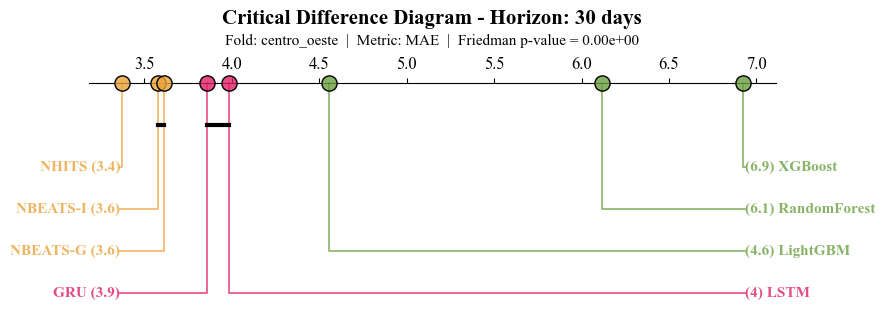


--- Processando Horizonte: 30days | Fold: coastal ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_coastal_30days.png


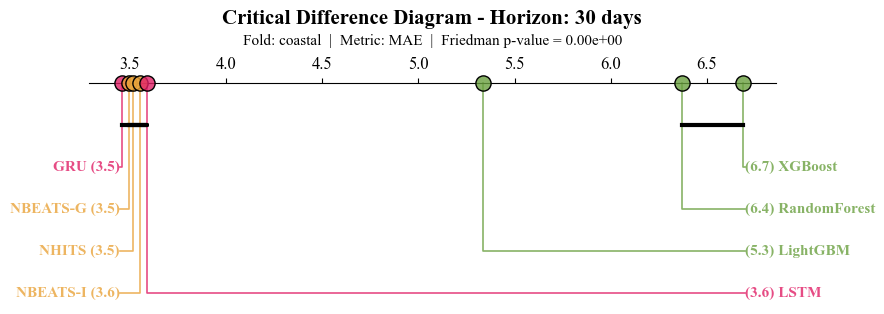


--- Processando Horizonte: 30days | Fold: sudeste ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_sudeste_30days.png


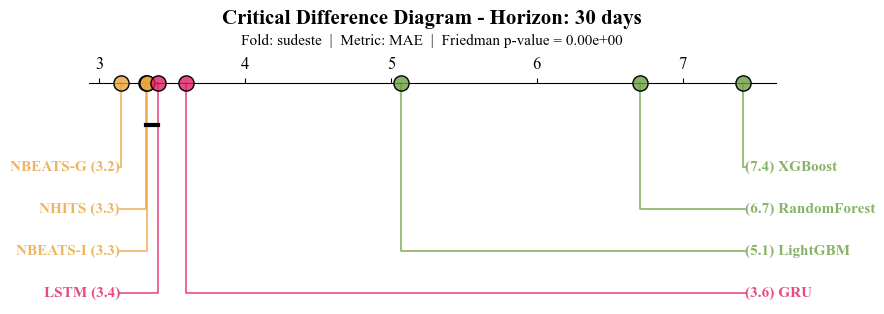


--- Processando Horizonte: 30days | Fold: sul ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_sul_30days.png


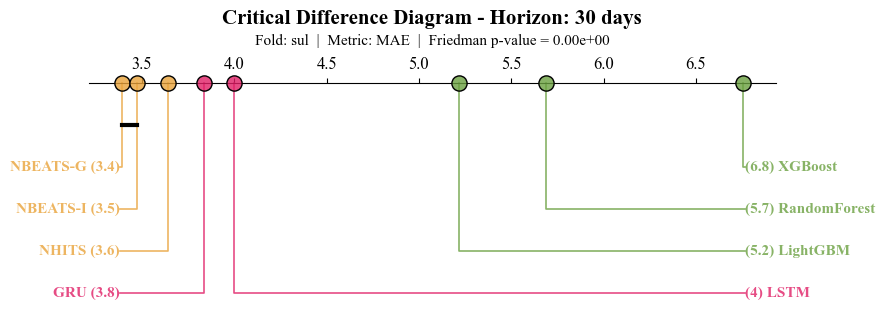


--- Processando Horizonte: 7days | Fold: centro_oeste ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_centro_oeste_7days.png


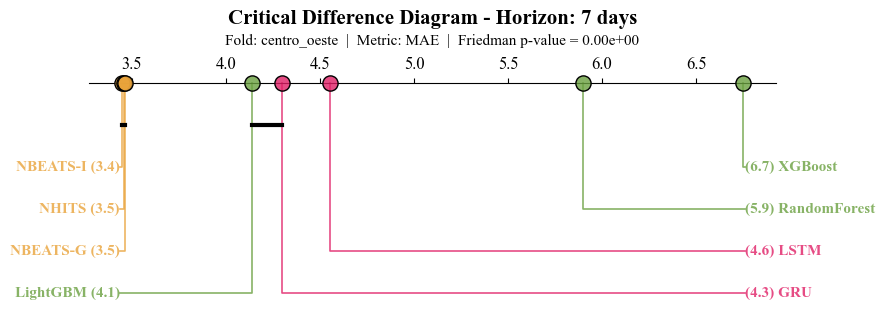


--- Processando Horizonte: 7days | Fold: coastal ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_coastal_7days.png


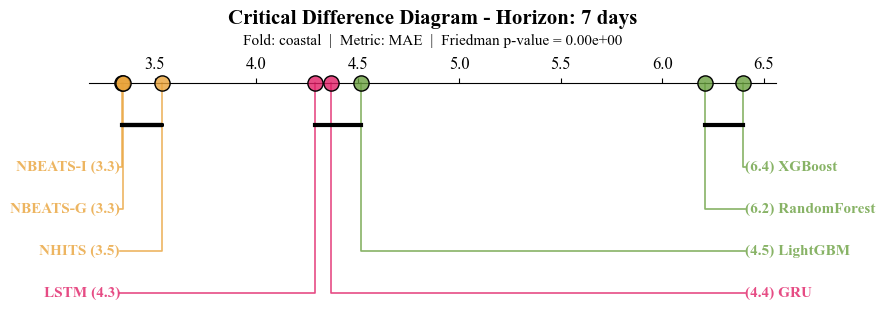


--- Processando Horizonte: 7days | Fold: sudeste ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_sudeste_7days.png


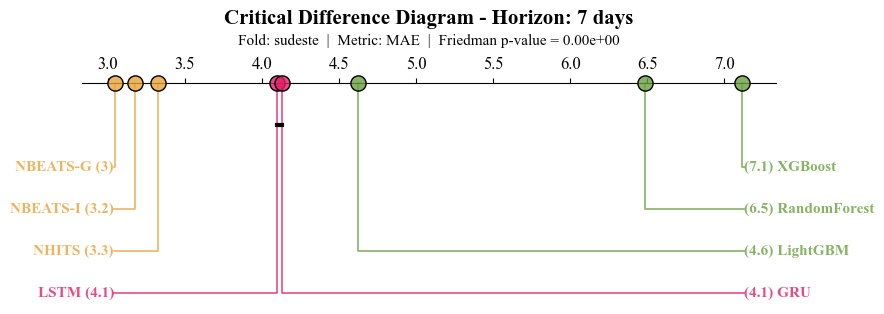


--- Processando Horizonte: 7days | Fold: sul ---
Friedman p-value: 0.0000e+00
Salvo: CD_Diagram_MAE_RQ2_sul_7days.png


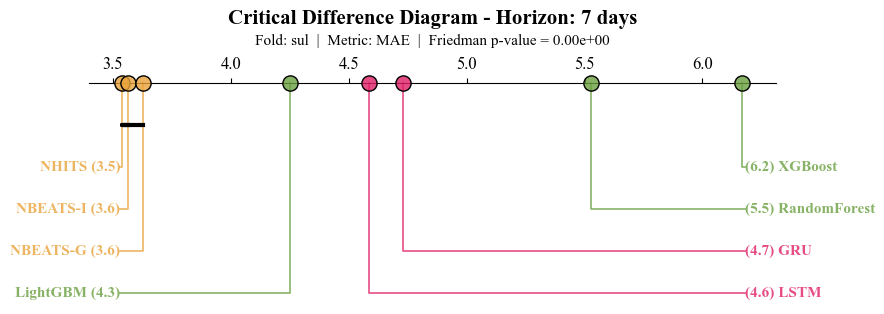

In [502]:
# =========================================================
# 0. CARREGAR MÉTRICAS RQ2
# =========================================================
metrics = pd.read_csv(r'..\Masters 26\Results\RQ2\metrics.csv')

# Modelos válidos na RQ2
valid_models = {
    "LightGBM", "RandomForest", "XGBoost",
    "LSTM", "GRU",
    "NHITS", "NBEATS-G", "NBEATS-I"
}

# Filtrar apenas modelos válidos
metrics = metrics[metrics["model"].isin(valid_models)]

# =========================================================
# 1. CONFIGURAÇÃO GLOBAL (Journal Style - Times New Roman)
# =========================================================
plt.rcdefaults()
mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.size": 12
})

categories = {
    "Machine Learning": {"LightGBM", "RandomForest", "XGBoost"},
    "Deep Learning": {"LSTM", "GRU", "Informer"},
    "Neural": {"NHITS", "NBEATS-G", "NBEATS-I"},
}

color_palette = {
    "Machine Learning": "#6aa040cc",
    "Deep Learning": "#e01f66cc",
    "Neural": "#e9a33acc",
}

# =========================================================
# 2. LOOP POR HORIZONTE E FOLD
# =========================================================
horizontes = metrics['horizon'].unique()
folds = metrics['fold'].unique()

for hor in horizontes:
    for fold in folds:
        
        print(f"\n--- Processando Horizonte: {hor} | Fold: {fold} ---")
        
        df_sub = metrics[
            (metrics['horizon'] == hor) &
            (metrics['fold'] == fold)
        ]
        
        if df_sub.empty:
            continue
        
        # Pivot: bloco = pollutant × unique_id × cutoff
        df_pivot = df_sub.pivot_table(
            index=['pollutant', 'unique_id', 'cutoff'],
            columns='model',
            values='MASE'
        ).dropna()

        if df_pivot.empty:
            continue

        # Matriz limpa para testes estatísticos
        df_nemenyi_input = df_pivot.reset_index(drop=True)

        # =========================================================
        # 3. TESTE DE FRIEDMAN
        # =========================================================
        stat, p_val = friedmanchisquare(
            *[df_nemenyi_input[col] for col in df_nemenyi_input.columns]
        )

        print(f"Friedman p-value: {p_val:.4e}")

        # =========================================================
        # 4. TESTE DE NEMENYI
        # =========================================================
        data_nemenyi = sp.posthoc_nemenyi_friedman(df_nemenyi_input)

        # =========================================================
        # 5. RANKS MÉDIOS
        # =========================================================
        ranks = df_pivot.rank(axis=1, ascending=True).mean().sort_values()

        # =========================================================
        # 6. HUE MAPPING (SEM 'Other')
        # =========================================================
        hue = pd.Series(index=ranks.index, dtype="object")

        for model in ranks.index:
            for cat, models in categories.items():
                if model in models:
                    hue[model] = cat
                    break

        # =========================================================
        # 7. CD DIAGRAM (ESTILO ORIGINAL)
        # =========================================================
        fig, ax = plt.subplots(figsize=(9, 3.3))
        
        hor_num = int(hor.replace("days", ""))
        hor_label = f"{hor_num} day" if hor_num == 1 else f"{hor_num} days"
        
        title_main = f"Critical Difference Diagram - Horizon: {hor_label}"
        subtitle = f"Fold: {fold}  |  Metric: MAE  |  Friedman p-value = {p_val:.2e}"

        ax.set_title(title_main, fontweight='bold', fontsize=15, pad=35, family='serif')
        ax.text(0.5, 1.12, subtitle, transform=ax.transAxes,
                ha='center', fontsize=11, family='serif')

        sp.critical_difference_diagram(
            ranks,
            data_nemenyi,
            ax=ax,
            hue=hue,
            color_palette=color_palette,
            label_props={"fontsize": 11, "fontweight": "bold"},
            marker_props={"s": 120, "edgecolor": "black", "linewidths": 1},
            elbow_props={"linewidth": 1.2},
            crossbar_props={"linewidth": 3, "color": "black"},
            text_h_margin=0.01
        )

        # Forçar Times New Roman
        for text in ax.findobj(match=mpl.text.Text):
            text.set_fontfamily("serif")
            text.set_fontname("Times New Roman")

        plt.tight_layout()

        file_name = f"CD_Diagram_MAE_RQ2_{fold}_{hor}.png"
        plt.savefig(file_name, format="png", bbox_inches="tight")
        print(f"Salvo: {file_name}")

        plt.show()

### Diebold-Mariano

In [ ]:
# =========================================================
# 1. FUNÇÃO DM (HLN CORRIGIDO)
# =========================================================
def diebold_mariano_test(target, forecast_m1, forecast_m2, h=1):
    e1 = np.abs(target - forecast_m1)
    e2 = np.abs(target - forecast_m2)
    d = e1 - e2
    T = len(d)

    def autocovariance(x, lag):
        if lag == 0:
            return np.var(x, ddof=1)
        if len(x) <= lag:
            return 0
        return np.cov(x[lag:], x[:-lag])[0][1]

    # Variância Newey-West (Bartlett)
    v_hat = autocovariance(d, 0)
    for k in range(1, h):
        v_hat += 2 * (1 - k/h) * autocovariance(d, k)

    if v_hat <= 0:
        return 0, 1.0

    dm_stat = np.mean(d) / np.sqrt(v_hat / T)

    # Correção HLN
    hln = np.sqrt((T + 1 - 2*h + (h/T)*(h-1)) / T)
    dm_stat_hln = hln * dm_stat

    p_value = 2 * stats.t.sf(np.abs(dm_stat_hln), df=T-1)

    return dm_stat_hln, p_value


# =========================================================
# 2. CONFIGURAÇÕES RQ2
# =========================================================
base_path = r'..\Masters 26\Results\RQ2\full'

# Apenas os poluentes existentes na RQ2
poluentes = ['go3', 'pm2p5']

# Apenas horizontes existentes
horizontes = {'7days': 56, '30days': 240}

# =========================================================
# 3. DETECÇÃO ROBUSTA DOS FOLDS
# (suporta nomes com underscore)
# =========================================================
folds_detectados = set()

for file in os.listdir(base_path):
    if file.endswith(".csv"):
        filename = file.replace(".csv", "")
        parts = filename.split("_")

        # Estrutura esperada:
        # pollutant + fold + horizon
        # Pode ser: go3_sul_7days
        # Ou: go3_centro_oeste_7days

        pol = parts[0]
        hor = parts[-1]
        fold = "_".join(parts[1:-1])

        if pol in poluentes and hor in horizontes:
            folds_detectados.add(fold)

folds = sorted(list(folds_detectados))

print("Folds detectados:", folds)


# =========================================================
# 4. MODELOS DA RQ2
# =========================================================
modelos_rq2 = [
    'NHITS', 'NBEATS-G', 'NBEATS-I',
    'LightGBM',
    'GRU', 'LSTM', 'Informer'
]

resultados_brutos = []

# =========================================================
# 5. EXECUÇÃO DOS TESTES (Pollutant × Fold × Horizon × cell)
# =========================================================
resultados_brutos = []

for pol in poluentes:
    for fold in folds:
        for hor, lag in horizontes.items():

            file_path = os.path.join(base_path, f'{pol}_{fold}_{hor}.csv')

            if not os.path.exists(file_path):
                continue

            df = pd.read_csv(file_path)

            if 'y' not in df.columns or 'unique_id' not in df.columns:
                continue

            df = df.sort_values(['unique_id', 'cutoff', 'ds'])
            grupos_celula = df.groupby('unique_id')

            for m1, m2 in itertools.combinations(modelos_rq2, 2):

                if m1 not in df.columns or m2 not in df.columns:
                    continue

                dm_stats_celulas = []

                for uid, df_cell in grupos_celula:

                    y_true = df_cell['y'].values
                    y_m1 = df_cell[m1].values
                    y_m2 = df_cell[m2].values

                    if len(y_true) <= lag:
                        continue

                    stat, p = diebold_mariano_test(
                        y_true, y_m1, y_m2, h=lag
                    )

                    if not np.isnan(stat):
                        dm_stats_celulas.append(stat)

                if len(dm_stats_celulas) < 3:
                    continue

                dm_stats_celulas = np.array(dm_stats_celulas)

                # Teste t sobre células
                t_stat, p_val = stats.ttest_1samp(dm_stats_celulas, 0)

                resultados_brutos.append({
                    'Pollutant': pol.upper(),
                    'Fold': fold,
                    'Horizon': hor,
                    'Model1': m1,
                    'Model2': m2,
                    'Mean_DM_Cell': np.mean(dm_stats_celulas),
                    't_stat_cell': t_stat,
                    'p_value_cell': p_val,
                    'N_cells': len(dm_stats_celulas)
                })

df_final = pd.DataFrame(resultados_brutos)

if df_final.empty:
    print("⚠️ Nenhum resultado DM foi gerado.")
else:

    # =========================================================
    # 6. HOLM-BONFERRONI
    # Correção dentro de cada (Pollutant × Fold × Horizon)
    # =========================================================
    df_final = pd.DataFrame(resultados_brutos)

    def apply_holm_correction(group):
        rejected, p_corrected, _, _ = multipletests(
            group['p_value_cell'], alpha=0.05, method='holm'
        )
        group['p_value_corrected'] = p_corrected
        group['Significant_05'] = rejected
        return group

    df_final = (
        df_final
        .groupby(['Pollutant', 'Fold', 'Horizon'], group_keys=False)
        .apply(apply_holm_correction)
    )

    # =========================================================
    # 7. DETERMINAR VENCEDOR
    # =========================================================
    def determine_winner(row):
        if not row['Significant_05']:
            return "Tie (Equal)"
        return row['Model1'] if row['Mean_DM_Cell'] < 0 else row['Model2'] 

    df_final['Superior_Model'] = df_final.apply(determine_winner, axis=1)

    df_final.to_csv("DM_RQ2_Holm_Corrected.csv", index=False)

    print("✅ DM RQ2 concluído com Holm-Bonferroni.")

Folds detectados: ['centro_oeste', 'coastal', 'sudeste', 'sul']
✅ DM RQ2 concluído com Holm-Bonferroni.


C:\Users\gustavo.filho\AppData\Local\Temp\ipykernel_27556\2684907875.py:174: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [183]:
def plot_universal_dominance_rq2(results_df, target_pollutant, target_fold, focal_model='NHITS'):

    df_temp = results_df[
        (results_df['Pollutant'] == target_pollutant.upper()) &
        (results_df['Fold'] == target_fold)
    ].copy()

    if df_temp.empty:
        print(f"Nenhum dado para {target_pollutant} - {target_fold}")
        return None

    mask = (df_temp['Model1'] == focal_model) | (df_temp['Model2'] == focal_model)
    df_filtered = df_temp[mask].copy()

    if df_filtered.empty:
        print(f"{focal_model} não encontrado em {target_pollutant} - {target_fold}")
        return None

    def get_score(row):
        opponent = row['Model2'] if row['Model1'] == focal_model else row['Model1']
        if row['Superior_Model'] == focal_model:
            score = 1
        elif row['Superior_Model'] == 'Tie (Equal)':
            score = 0
        else:
            score = -1
        return pd.Series([opponent, score], index=['Opponent', 'Score'])

    df_filtered[['Opponent', 'Score']] = df_filtered.apply(get_score, axis=1)

    pivot_heat = df_filtered.groupby(['Opponent', 'Horizon'])['Score'].mean().unstack()

    # Horizonte fixo
    h_order = ['7days', '30days']
    pivot_heat = pivot_heat.reindex(columns=h_order)

    # Ordem fixa dos modelos
    model_order = [
        'LightGBM', 'RandomForest', 'XGBoost',
        'GRU', 'LSTM',
        'NHITS', 'NBEATS-G', 'NBEATS-I',
    ]

    # Remove o modelo focal
    model_order = [m for m in model_order if m != focal_model]

    # Reindex completo (FORÇA TODOS OS MODELOS)
    pivot_heat = pivot_heat.reindex(index=model_order)

    # Preenche ausentes com empate (= 0)
    pivot_heat = pivot_heat.fillna(0)

    label_map = {-1: "↓", 0: "=", 1: "↑"}
    text_matrix = np.vectorize(lambda x: label_map.get(x, ""), otypes=[object])(pivot_heat.values)

    fig = go.Figure(data=go.Heatmap(
        z=pivot_heat.values,
        x=pivot_heat.columns,
        y=pivot_heat.index,
        zmin=-1,
        zmax=1,
        colorscale=[[0.0, "#A74752"], [0.5, "#F7F7F7"], [1.0, "#2FB669"]],
        showscale=False,
        text=text_matrix,
        texttemplate="%{text}",
        textfont=dict(family="Times New Roman", size=14),
        xgap=4,
        ygap=4
    ))

    fig.update_layout(
        font=dict(family="Times New Roman", size=14),
        width=450,
        height=400,
        plot_bgcolor="white"
    )

    return fig

In [184]:
# Modelos focais desejados
modelos_focais = ['NHITS', 'NBEATS-G', 'NBEATS-I']

# Detectar folds existentes no df_final
folds_disponiveis = sorted(df_final['Fold'].unique())

for fold_escolhido in folds_disponiveis:
    for modelo_focal in modelos_focais:

        figs_ = []

        for pol_ in ['PM2P5', 'GO3']:
            fig_temp = plot_universal_dominance_rq2(
                df_final,
                target_pollutant=pol_,
                target_fold=fold_escolhido,
                focal_model=modelo_focal
            )
            figs_.append(fig_temp)

        fig = make_subplots(
            rows=1,
            cols=2,
            subplot_titles=[
                r'$\text{PM}_{2.5}$',
                r'$\text{O}_{3}$'
            ],
            vertical_spacing=0.10,
            horizontal_spacing=0.03,
            shared_yaxes=True
        )

        positions = [(1,1), (1,2)]

        for f, pos in zip(figs_, positions):
            if f is None:
                continue
            for trace in f.data:
                fig.add_trace(trace, row=pos[0], col=pos[1])

        fig.update_layout(
            title=dict(
                text=f"<b>Universal Dominance Heatmaps: {modelo_focal} Base</b>"
                     f"<br><sup>Fold: {fold_escolhido} | Holm Corrected</sup>",
                y=0.95,
                yanchor="top"
            ),
            font=dict(family="Times New Roman", size=14),

            annotations=list(fig.layout.annotations) + [
                dict(
                    text="Legend: (↑) Superior  (=) No Significant Difference  (↓) Inferior",
                    x=0.73,
                    y=1.17,
                    xref="paper",
                    yref="paper",
                    showarrow=False,
                    font=dict(size=13, color="gray"),
                    xanchor="center"
                )
            ],

            plot_bgcolor="white",
            margin=dict(t=80, b=50, l=30, r=30),
            width=750,
            height=450,
        )

        # Ajustar posição vertical dos títulos dos subplots
        for annot in fig.layout.annotations:
            if annot.text in [r'$\text{PM}_{2.5}$', r'$\text{O}_{3}$']:
                annot.y += 0.02
                annot.font.size = 18

        fig.update_xaxes(showgrid=False)
        fig.update_yaxes(showgrid=False)

        fig.show()

        filename = f"universal_dominance_RQ2_{modelo_focal}_{fold_escolhido}.png"
        fig.write_image(filename, scale=3)

        print(f"Salvo: {filename}")

Salvo: universal_dominance_RQ2_NHITS_centro_oeste.png


Salvo: universal_dominance_RQ2_NBEATS-G_centro_oeste.png


Salvo: universal_dominance_RQ2_NBEATS-I_centro_oeste.png


Salvo: universal_dominance_RQ2_NHITS_coastal.png


Salvo: universal_dominance_RQ2_NBEATS-G_coastal.png


Salvo: universal_dominance_RQ2_NBEATS-I_coastal.png


Salvo: universal_dominance_RQ2_NHITS_sudeste.png


Salvo: universal_dominance_RQ2_NBEATS-G_sudeste.png


Salvo: universal_dominance_RQ2_NBEATS-I_sudeste.png


Salvo: universal_dominance_RQ2_NHITS_sul.png


Salvo: universal_dominance_RQ2_NBEATS-G_sul.png


Salvo: universal_dominance_RQ2_NBEATS-I_sul.png


## Geospatial Analysis

Graph made at QGIS

In [288]:
def get_rankings_table(metrics_rq2, metric="MAE", agg_func='mean'):
    """
    Gera uma tabela de rankings por poluente, horizonte e unique_id.
    
    Args:
        metrics_rq2: DataFrame original com as métricas.
        metric: A métrica a ser avaliada (ex: 'MAE', 'RMSE').
        agg_func: Função de agregação (caso haja múltiplas previsões para o mesmo id/horizonte).
    """
    
    # 1. Agrupar os dados incluindo o unique_id
    # O observed=False garante que categorias vazias não quebrem o código se usar tipos Categorical
    df_ranks = (
        metrics_rq2
        .groupby(["pollutant", "horizon", "unique_id", "model", 'fold'], observed=False)[metric]
        .agg(agg_func)
        .reset_index()
    )

    # 2. Calcular o Ranking
    # Agrupamos por pollutant, horizon e unique_id. 
    # O rank é calculado entre os modelos dentro de cada um desses grupos.
    df_ranks["ranking"] = (
        df_ranks
        .groupby(["pollutant", "horizon", "unique_id"], observed=False)[metric]
        .rank(method="min", ascending=True) # method="min" dá rank 1, 2, 2, 4 em caso de empate
    )

    # 3. Ordenação para facilitar a leitura
    df_ranks = df_ranks.sort_values(["pollutant", "horizon", "unique_id", "ranking"])

    return df_ranks

# Exemplo de uso:
df_final = get_rankings_table(metrics_rq2, metric="MAE")

# Se quiser ver apenas os "Top 1" de cada série:
# top_1 = df_final[df_final['ranking'] == 1]
df_final = df_final.merge(
    pd.read_csv(r'..\Data\CAMS\processed\unique_id_info.csv'),
    on='unique_id', how='left'
)
df_final.to_csv('RQ2_results.csv', index=False)

In [290]:
geo_ = (
    df_final
    .groupby(['model', 'ranking', 'fold'])['unique_id'].count()
    .reset_index()
    .sort_values('unique_id', ascending=False)
    .query("ranking.isin([1, 2, 3])")
    .pivot_table(
        index='model', columns='ranking', values='unique_id', aggfunc='sum'
    )
)
geo_ = geo_.astype({
    1: 'Int64',
    2: 'Int64',
    3: 'Int64',
})
geo_[2] = geo_[2].astype('Int64')
geo_[3] = geo_[3].astype('Int64')
geo_['Total'] = geo_.sum(axis=1).astype('Int64')
geo_['Percent'] = (100* geo_['Total'] / (33*4*4)).round(2)
geo_ = geo_.sort_values("Percent", ascending=False)
geo_['Percent'] = geo_['Percent'].apply(lambda x: f'{x}%')
geo_ = geo_.astype({
    1: 'str',
    2: 'str',
    3: 'str',
})
geo_ = geo_.replace('<NA>', '-')
geo_.to_excel(r'geo_top3_MAE.xlsx')

In [334]:
geo_MASE_ = (
    metrics_rq2
    .merge(
        pd.read_csv(r'..\Data\CAMS\processed\unique_id_info.csv'),
        on='unique_id', how='left'
    )
    .groupby(['pollutant', 'fold', 'horizon', 'model', 'unique_id'])
    .agg({
        'MAE': ('mean', 'std', 'median'),
        'MASE': ('mean', 'std', 'median'),
        'Skill_MAE': 'mean',
        'latitude': 'first',
        'longitude': 'first',
        'abbrev_state': 'first',
        'name_state': 'first',
        'name_region': 'first',
        'coastal': 'first',
        'inland': 'first',
    })
    .reset_index()
)
geo_MASE_.columns = [
    '_'.join(col).strip('_') if isinstance(col, tuple) else col
    for col in geo_MASE_.columns
]
geo_MASE_.to_csv(r'geo_MASE_by_cell.csv', index=False)

Plotando: go3 | sul | 7days | NHITS


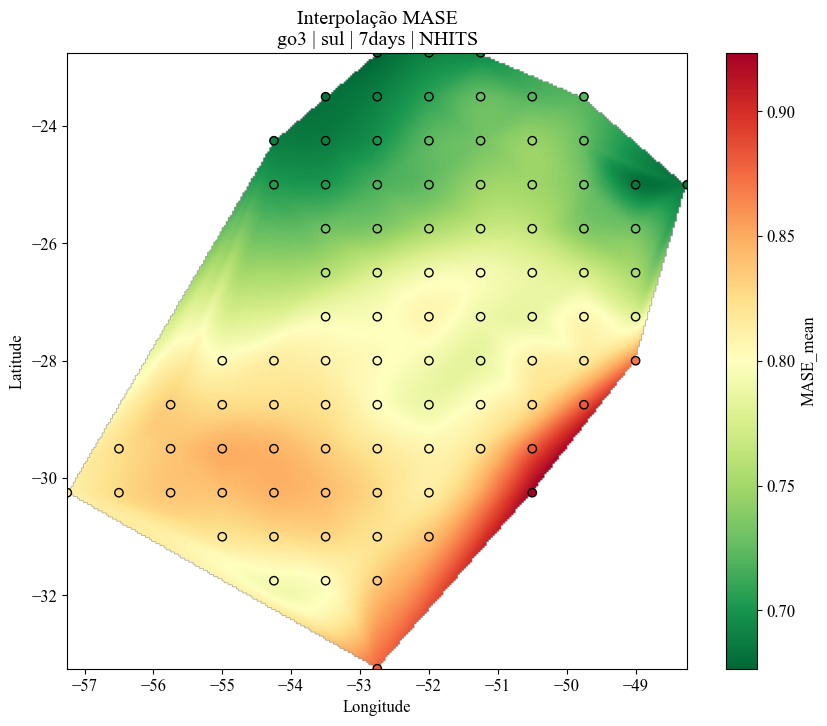

Plotando: go3 | sul | 30days | NHITS


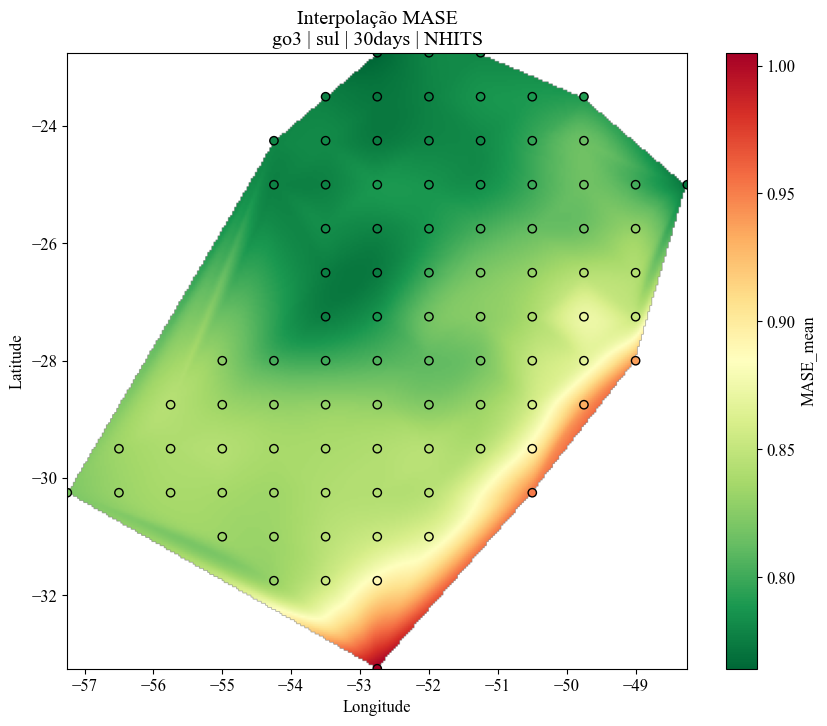

Plotando: pm2p5 | sul | 7days | NHITS


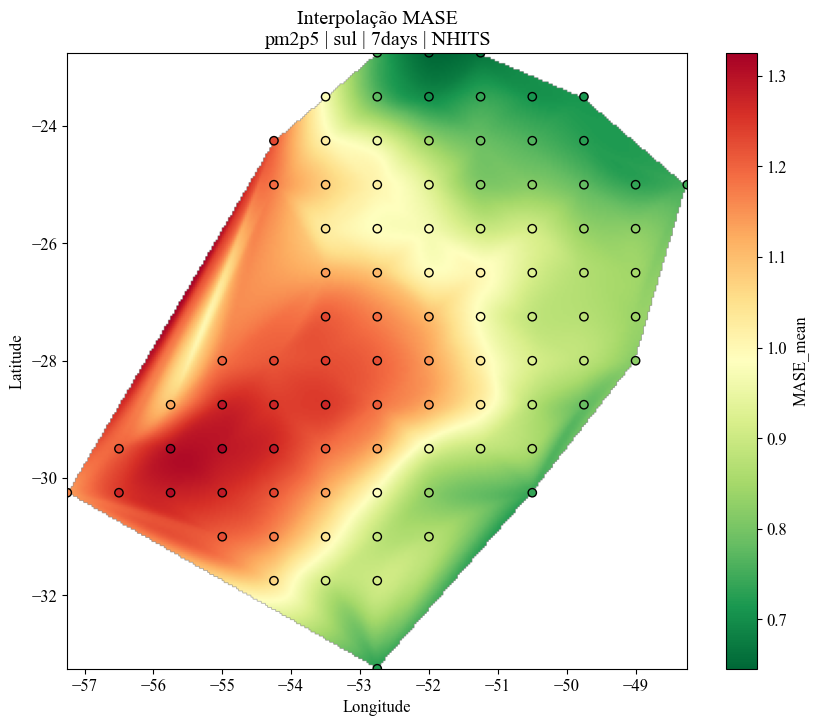

Plotando: pm2p5 | sul | 30days | NHITS


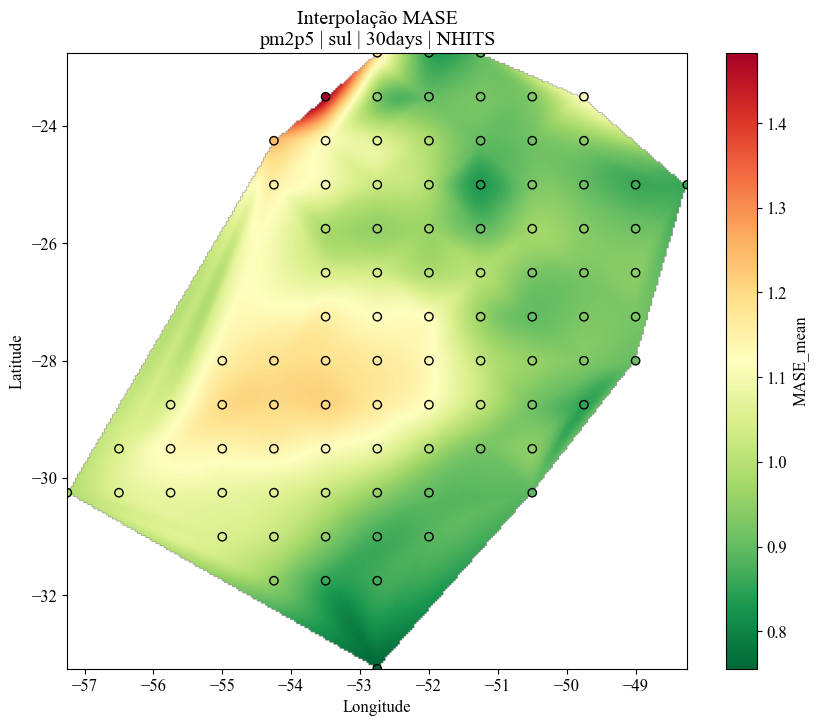

In [ ]:
def plot_mase_map(
    df,
    pollutant='go3',
    fold='sul',
    horizon='30days',
    model='NHITS',
    method='cubic',   # 'linear', 'nearest', 'cubic'
    grid_res=300
):
    
    # 1️⃣ Filtrar
    filtered = df[
        (df['pollutant'] == pollutant) &
        (df['fold'] == fold) &
        (df['horizon'] == horizon) &
        (df['model'] == model)
    ][['unique_id', 'MASE_mean', 'latitude_first', 'longitude_first']].dropna()
    
    if filtered.empty:
        print("Filtro retornou vazio.")
        return
    
    # 2️⃣ Coordenadas
    lats = filtered['latitude_first'].values
    lons = filtered['longitude_first'].values
    values = filtered['MASE_mean'].values
    
    # 3️⃣ Criar grade espacial
    grid_lon, grid_lat = np.meshgrid(
        np.linspace(lons.min(), lons.max(), grid_res),
        np.linspace(lats.min(), lats.max(), grid_res)
    )
    
    # 4️⃣ Interpolação
    grid_values = griddata(
        points=(lons, lats),
        values=values,
        xi=(grid_lon, grid_lat),
        method=method
    )
    
    # 5️⃣ Plot
    plt.figure(figsize=(10, 8))
    
    cmap = plt.cm.RdYlGn_r  # verde = bom (MASE baixo), vermelho = ruim
    
    im = plt.imshow(
        grid_values,
        extent=(lons.min(), lons.max(), lats.min(), lats.max()),
        origin='lower',
        cmap=cmap,
        aspect='auto'
    )
    
    plt.scatter(lons, lats, c=values, cmap=cmap, edgecolor='k')
    
    plt.colorbar(im, label='MASE_mean')
    plt.title(f"Interpolação MASE\n{pollutant} | {fold} | {horizon} | {model}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()


for pol_ in ['go3', 'pm2p5']:
    for fold_ in ['sul']:
        for hor_ in ['7days', '30days']:
            for model_ in ['NHITS',]:
                print(f"Plotando: {pol_} | {fold_} | {hor_} | {model_}")
                plot_mase_map(
                    geo_MASE_,
                    pollutant=pol_,
                    fold=fold_,
                    horizon=hor_,
                    model=model_
                )

## Boxplot Seen-Unseen

In [499]:
def plot_boxplot_metrics_rq2(horizons: list = ['7', '30'], 
                             metric: str = 'Skill_MAE_vs_RQ1',
                             models: list = None,
                             pollutants: list = None,
                             colors: list = ["#B3C7F9", "#6B8EF6", "#365FCE", "#1D2E91"],
                             x_range: list = None,
                             metric_title: str = None,
                             boxmean: str = 'sd',
                             fold: str = 'coastal'):

    # ===============================
    # DATA PREPARATION
    # ===============================
    df_plot = metrics_rq2.dropna(subset=[metric]).copy()
    df_plot = df_plot[df_plot['fold'] == fold]

    if models:
        df_plot = df_plot[df_plot['model'].isin(models)]

    if pollutants:
        df_plot = df_plot[df_plot['pollutant'].isin(pollutants)]

    df_plot = df_plot[df_plot['horizon'].isin([f'{h}days' for h in horizons])]

    # ===============================
    # COLOR SCALE
    # ===============================
    horizon_color_map = {str(h): colors[i] for i, h in enumerate(horizons)}

    # ===============================
    # BOXPLOT
    # ===============================
    box_data = []

    for horizon_idx, horizon in enumerate(list(reversed(horizons))): 
        horizon_data = df_plot[df_plot['horizon'] == f'{horizon}days']
        current_color = horizon_color_map[horizon]

        box_data.append(
            go.Box(
                x=horizon_data[metric],
                y=horizon_data['model'],
                name=f'{horizon}days',
                boxmean=boxmean,
                line=dict(color=current_color),
                marker=dict(
                    color='lightgrey',
                    opacity=0.5,
                    size=6
                ),
                orientation='h',
                pointpos=0,
                offsetgroup=horizon_idx,
                boxpoints='suspectedoutliers',
                jitter=0.1,
            )
        )

    # ===============================
    # LAYOUT
    # ===============================
    fig = go.Figure(data=box_data)

    plotlymodex.main_layout(
        fig, width=900, height=700,
        x=metric if metric_title is None else metric_title,
        y=None,
    )

    fig.update_layout(
        title=f'Skill MAE Boxplot by Model and Horizon for PM<sub>2.5</sub>',
        xaxis_title=metric if metric_title is None else metric_title,
        yaxis_title=None,
        boxmode='group',
        boxgap=0.25,
        boxgroupgap=0.1,
        font=dict(family="Times New Roman", size=16),
        xaxis=dict(
            showgrid=True,
            gridwidth=0.4,
            gridcolor="rgba(0,0,0,0.05)",
            range=x_range,
            nticks=18
        ),
        yaxis=dict(
            showgrid=False,
            showticklabels=True,
            autorange=True,
            categoryorder='array',
            categoryarray=models
        ),
        margin=dict(l=120, r=40, t=100, b=60),
        showlegend=True,
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="center",
            x=0.,
        ),
    )

    return fig


fig = plot_boxplot_metrics_rq2(
    horizons=[
        '7',
        '30'
    ],
    models=[
        'XGBoost',
        'RandomForest',
        'LightGBM', 
        'GRU', 
        'LSTM',
        'NBEATS-I', 
        'NBEATS-G', 
        'NHITS'
    ],
    pollutants=[
        # 'go3', 
        'pm2p5'
    ], 
    metric='Skill_MAE_vs_RQ1',
    metric_title='MAE Skill vs RQ1',
    colors=["#3692cf", "#ce692f"],
    x_range=[-0.5, 0.4], 
    boxmean='sd',
    fold='sul' # Somete 'sul' e 'coastal' (PR)
)

fig.show()
fig.write_image("boxplot_skill_mae_rq2.png", scale=3)

In [ ]:
def generate_metrics_table(df, horizons=['7', '30'], models=None, pollutants=None, folds=['sul', 'coastal']):
    # 1. Filtragem inicial (seguindo a lógica do seu gráfico)
    df_tab = df.copy()
    
    if models:
        df_tab = df_tab[df_tab['model'].isin(models)]
    if pollutants:
        df_tab = df_tab[df_tab['pollutant'].isin(pollutants)]
    if folds:
        df_tab = df_tab[df_tab['fold'].isin(folds)]
        
    df_tab = df_tab[df_tab['horizon'].isin([f'{h}days' for h in horizons])]

    # 2. Agrupamento e cálculo das estatísticas
    # Aqui calculamos média, mediana e desvio padrão para o Skill_MAE_vs_RQ1
    stats = df_tab.groupby(['model', 'fold', 'pollutant', 'horizon'])['Skill_MAE_vs_RQ1'].agg(
        média='mean',
        mediana='median',
        std='std'
    ).reset_index()

    # 3. Transformação para formato largo (Pivot)
    # Criamos a hierarquia fold_pollutant_horizon_statistic nas colunas
    table = stats.pivot_table(
        index='model',
        columns=['fold', 'pollutant', 'horizon'],
        values=['média', 'mediana', 'std']
    )

    # 4. Ajuste dos nomes das colunas para o formato solicitado: fold_pollutant_horizon_statistic
    # O pivot do pandas coloca a estatística no nível superior, vamos reordenar
    table.columns = [f"{f}_{p}_{h}_{stat}" for stat, f, p, h in table.columns]
    
    # Reordenar as linhas conforme a ordem de modelos que você definiu no gráfico
    if models:
        table = table.reindex(models)

    return table

# --- Execução ---
df_final_stats = generate_metrics_table(
    metrics_rq2, 
    horizons=['7', '30'],
    models=['XGBoost', 'RandomForest', 'LightGBM', 'GRU', 'LSTM', 'NBEATS-I', 'NBEATS-G', 'NHITS'],
    pollutants=['go3', 'pm2p5'],
    folds=['sul', 'sudeste', 'centro_oeste']
)

# Para visualizar no Jupyter ou exportar
df_final_stats

# Destaca o maior valor (melhor skill) em cada coluna
df_final_stats.style.highlight_max(axis=0, color='lightgreen')

,sul_go3_30days_mediana,sul_go3_7days_mediana,sul_pm2p5_30days_mediana,sul_pm2p5_7days_mediana,sul_go3_30days_média,sul_go3_7days_média,sul_pm2p5_30days_média,sul_pm2p5_7days_média,sul_go3_30days_std,sul_go3_7days_std,sul_pm2p5_30days_std,sul_pm2p5_7days_std
model,,,,,,,,,,,,
XGBoost,-0.025792,-0.025343,-0.047834,-0.051786,-0.022645,-0.026872,-0.052578,-0.056505,0.031440,0.051207,0.062252,0.088546
RandomForest,-0.012515,-0.009260,0.051785,0.032973,-0.034417,-0.052614,0.003322,-0.015907,0.076350,0.133292,0.165224,0.205215
LightGBM,-0.083216,-0.058387,0.007826,0.009839,-0.110047,-0.083503,-0.011582,0.007777,0.126494,0.161756,0.269163,0.103061
GRU,-0.008242,-0.029895,-0.000496,0.010408,-0.029429,-0.035653,-0.005538,-0.006042,0.111868,0.112164,0.098763,0.142663
LSTM,-0.021851,-0.014608,0.001451,-0.015234,-0.048580,-0.019207,-0.004209,-0.029244,0.126495,0.088079,0.073323,0.119187
NBEATS-I,-0.021398,-0.004472,-0.016774,-0.008627,-0.032628,-0.013447,-0.026885,-0.021606,0.080521,0.116245,0.066113,0.139695
NBEATS-G,-0.015094,-0.012073,-0.017345,-0.017994,-0.028336,-0.011779,-0.030775,-0.027026,0.094847,0.112112,0.072805,0.153615
NHITS,-0.022615,-0.017709,-0.019934,-0.020360,-0.031939,-0.026974,-0.041674,-0.029097,0.074663,0.112533,0.097717,0.115713


## MASE Analysis

In [318]:
fig = plotlymodex.frequency(
    metrics_rq2, 'MASE', 'fold', 
    bin_size=0.01, show_hist=True,
    colors=["#862fce", "#36cfcf", "#be8f36", "#36cf5c"],
)
fig.layout.xaxis.range = [0, 2.5]

fig.update_layout(
    font_family="Times New Roman",
    font_color="black",
    legend_title_font_family="Times New Roman",
    font_size=14 
)

fig.show()

In [559]:
def plot_metric_linear(
        fold_sel = 'sul', 
        pollutant_sel = 'go3', 
        horizon_sel = '7days', 
        model_sel = 'NHITS',
        metric = 'MASE',
        ):

    df_ = (
        metrics_rq2
        .merge(
            pd.read_csv(r'..\Data\CAMS\processed\unique_id_info.csv'),
            on='unique_id', how='left'
        )
    )

    subset = df_[
        (df_["fold"] == fold_sel) &
        (df_["pollutant"] == pollutant_sel) &
        (df_["horizon"] == horizon_sel) &
        (df_["model"] == model_sel)
    ]

    outside_fold = df_[
        (df_["fold"] != fold_sel) &
        (df_["pollutant"] == pollutant_sel) &
        (df_["horizon"] == horizon_sel) &
        (df_["model"] == model_sel)
    ]

    lat_c = outside_fold["latitude"].mean()
    lon_c = outside_fold["longitude"].mean()

    subset = subset.copy()

    subset["dist_to_centroid"] = np.sqrt(
        (subset["latitude"] - lat_c)**2 +
        (subset["longitude"] - lon_c)**2
    )

    agg = subset.groupby("unique_id").agg({
        "dist_to_centroid": "mean",
        f"{metric}": "median"
    }).reset_index()

    # Regressão linear (mesma ideia do regplot)
    X = sm.add_constant(agg["dist_to_centroid"])
    model = sm.OLS(agg[f"{metric}"], X).fit()

    x_range = np.linspace(
        agg["dist_to_centroid"].min(),
        agg["dist_to_centroid"].max(),
        200
    )
    y_pred = model.predict(sm.add_constant(x_range))

    # -------- Label formatting -------- #

    fold_map = {
        "sul": "South",
        "sudeste": "Southeast",
        "centro_oeste": "Midwest",
        "coastal": "Coastal"
    }

    pollutant_map = {
        "go3": "O<sub>3</sub>",
        "pm2p5": "PM<sub>2.5</sub>"
    }

    horizon_map = {
        "7days": "7 days",
        "30days": "30 days"
    }

    metric_map = {
        "MASE": "MASE",
        "MASE_denom": "Seasonal Naive MAE",
        "MAE": "Model MAE"
    }

    fold_label = fold_map.get(fold_sel, fold_sel)
    pollutant_label = pollutant_map.get(pollutant_sel, pollutant_sel)
    horizon_label = horizon_map.get(horizon_sel, horizon_sel)
    metric_label = metric_map.get(metric, metric)

    # -------- Regression -------- #

    X = sm.add_constant(agg["dist_to_centroid"])
    model = sm.OLS(agg[f"{metric}"], X).fit()

    x_range = np.linspace(
        agg["dist_to_centroid"].min(),
        agg["dist_to_centroid"].max(),
        200
    )
    y_pred = model.predict(sm.add_constant(x_range))

    # -------- Plot -------- #

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=agg["dist_to_centroid"],
            y=agg[f"{metric}"],
            mode="markers",
            marker=dict(
                color="black",
                size=8,
                opacity=0.7
            ),
            showlegend=False
        )
    )

    fig.add_trace(
        go.Scatter(
            x=x_range,
            y=y_pred,
            mode="lines",
            line=dict(width=2, color="orange"),
            showlegend=False
        )
    )

    # -------- Regression coefficients annotation -------- #

    intercept = model.params.iloc[0]
    slope = model.params.iloc[1]
    r2 = model.rsquared

    fig.add_annotation(
        x=0.98,
        y=0.03,
        xref="paper",
        yref="paper",
        text=(
            f"Intercept = {intercept:.4f}<br>"
            f"Slope = {slope:.4f}<br>"
            f"R² = {r2:.3f}"
        ),
        showarrow=False,
        align="right",
        font=dict(size=14),
        bordercolor="black",
        borderwidth=0.5,
        borderpad=4,
        bgcolor="white",
        opacity=0.9
    )

    fig.update_layout(
        template="simple_white",
        width=800,
        height=600,
        font=dict(
            family="Times New Roman",
            size=16
        ),
        xaxis=dict(
            title="Distance to Train Centroid [°]",
            showgrid=True,
            gridwidth=0.5,
            zeroline=False
        ),
        yaxis=dict(
            title=f"{metric_label}",
            showgrid=True,
            gridwidth=0.5,
            zeroline=False
        ),
        margin=dict(l=70, r=40, t=40, b=70),
        title=dict(
            text=f"{metric_label} × Distance for {pollutant_label} - {horizon_label} - {fold_label}",
            x=0.5
        )
    )

    return fig


fig_ = plot_metric_linear(
    fold_sel='sudeste',
    pollutant_sel='pm2p5',
    horizon_sel='7days',
    model_sel='NHITS',
    metric = 'MASE'
)
# fig_ = plot_metric_linear(
#     fold_sel='centro_oeste',
#     pollutant_sel='pm2p5',
#     horizon_sel='7days',
#     model_sel='NHITS',
#     metric = 'MASE'
# )
fig_ = plot_metric_linear(
    fold_sel='coastal',
    pollutant_sel='pm2p5',
    horizon_sel='7days',
    model_sel='NHITS',
    metric = 'MASE'
)
fig_.show()
fig_.write_image("x.png", scale=3)

In [ ]:
def analyze_metric_regression(df_metrics, metric='MASE'):
    # Configurações de iteração
    folds = ['sul', 'sudeste', 'centro_oeste', 'coastal']
    pollutants = ['go3', 'pm2p5']
    horizons = ['7days', '30days']
    models = ['GRU', 'LSTM', 'NHITS', 'NBEATS-G', 'NBEATS-I', 'RandomForest', 'XGBoost', 'LightGBM']
    
    # Carregar info geográfica (ajuste o path se necessário)
    df_geo = pd.read_csv(r'..\Data\CAMS\processed\unique_id_info.csv')
    
    # Merge inicial para ter lat/lon
    df_full = df_metrics.merge(df_geo, on='unique_id', how='left')
    
    results = []

    for f in folds:
        for p in pollutants:
            for h in horizons:
                for m in models:
                    # 1. Filtrar subset do fold atual e o que está fora dele (para o centroide)
                    subset = df_full[
                        (df_full["fold"] == f) & 
                        (df_full["pollutant"] == p) & 
                        (df_full["horizon"] == h) & 
                        (df_full["model"] == m)
                    ]
                    
                    outside_fold = df_full[
                        (df_full["fold"] != f) & 
                        (df_full["pollutant"] == p) & 
                        (df_full["horizon"] == h) & 
                        (df_full["model"] == m)
                    ]
                    
                    # Pular se não houver dados suficientes para regressão
                    if subset.empty or outside_fold.empty:
                        continue
                        
                    # 2. Calcular Centroide do Treino e Distâncias
                    lat_c = outside_fold["latitude"].mean()
                    lon_c = outside_fold["longitude"].mean()
                    
                    subset = subset.copy()
                    subset["dist_to_centroid"] = np.sqrt(
                        (subset["latitude"] - lat_c)**2 + 
                        (subset["longitude"] - lon_c)**2
                    )
                    
                    # 3. Agregação por unique_id (caso haja múltiplas previsões por ID)
                    agg = subset.groupby("unique_id").agg({
                        "dist_to_centroid": "mean",
                        metric: "median"
                    }).reset_index()
                    
                    if len(agg) < 2: # Necessário ao menos 2 pontos para regressão
                        continue

                    # 4. Regressão Linear
                    try:
                        X = sm.add_constant(agg["dist_to_centroid"])
                        y = agg[metric]
                        ols_model = sm.OLS(y, X).fit()
                        
                        # Armazenar resultados
                        results.append({
                            "Fold": f,
                            "Pollutant": p,
                            "Horizon": h,
                            "Model": m,
                            "Intercept": ols_model.params.iloc[0],
                            "Slope": ols_model.params.iloc[1],
                            "R2": ols_model.rsquared
                        })
                    except:
                        continue

    # Criar DataFrame final
    df_results = pd.DataFrame(results)
    return df_results

# --- Exemplo de Uso ---
results_table = analyze_metric_regression(metrics_rq2, metric='MASE')

In [ ]:
for fold in results_table['Fold'].unique():
    for pollutant in results_table['Pollutant'].unique():
        for horizon in results_table['Horizon'].unique():
            subset = results_table[
                (results_table['Fold'] == fold) &
                (results_table['Pollutant'] == pollutant) &
                (results_table['Horizon'] == horizon)
            ]
            if not subset.empty:
                print(f"\nFold: {fold} | Pollutant: {pollutant} | Horizon: {horizon}")
                print(subset[['Model', 'R2', 'Slope', 'Intercept']].sort_values('Slope'))

# print(
#     results_table
#     .query("Fold == 'sul' and Pollutant == 'pm2p5' and Horizon == '30days'")
#     .groupby("Model")[['R2', 'Slope', 'Intercept']].mean()
#     .sort_values("Slope", ascending=True)
# )

## Train-Test Relationship

In [ ]:

# 1. Definir o mapeamento do tamanho do treino conforme sua Tabela 4.1
# 'fold' no seu df de métricas deve bater com essas chaves
train_sizes = {
    'sul': 197,           # Protocolo P1
    'centro_oeste': 233,  # Protocolo P2
    'sudeste': 146,       # Protocolo P3
    'coastal': 266        # Protocolo P4
}

def analyze_training_volume_impact(df_metrics, metric='MASE'):
    # Filtrar apenas os modelos globais de interesse
    models_to_plot = [
    'NHITS', 'NBEATS-G', 'NBEATS-I', 
    # 'XGBoost', 'LightGBM'
    ]
    df_filtered = df_metrics[df_metrics['model'].isin(models_to_plot)].copy()
    
    # 2. Agregar erro médio/mediano por Fold e Modelo
    # (Agregamos por pollutant e horizon também para não misturar dinâmicas)
    df_agg = df_filtered.groupby(['fold', 'model', 'pollutant', 'horizon'])[metric].median().reset_index()
    
    # 3. Mapear o tamanho do treino
    df_agg['train_size'] = df_agg['fold'].map(train_sizes)
    
    # 4. Cálculo de Correlação Geral
    corr, p_value = pearsonr(df_agg['train_size'], df_agg[metric])
    print(f"Correlação de Pearson Geral (Treino vs {metric}): {corr:.4f} (p-value: {p_value:.4f})")
    
    # 5. Visualização
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df_agg, x='train_size', y=metric, hue='model', style='pollutant', s=100)
    
    # Adicionar uma linha de tendência geral
    sns.regplot(data=df_agg, x='train_size', y=metric, scatter=False, color='black', label='Tendência Geral')
    
    plt.title(f'Impacto do Volume de Dados de Treino na Performance ({metric})')
    plt.xlabel('Número de Células no Conjunto de Treino')
    plt.ylabel(f'{metric} (Mediana no Test Set)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return df_agg

# Executar a análise
df_impact = analyze_training_volume_impact(metrics_rq2, metric='MASE')